# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>1. Import Library</b></div>

<div style="border-radius:10px; border: #FFA500 solid; padding: 15px; font-size:100%;">

📌 **Experimental Parameters**
    
- `Image Size`: 256X256
    
- `CLAHE(Contrast Limited Adaptive Histogram Equalization)`: clipLimit: ??, tileGridSize: ??
    
    clip_limits = [1.0,2,0,3,0,4,0]
    tile_grid_sizes = [(2,2), (4,4),(8,8)]

- `Label : Edema, No_finding, Pneumoniae, Tuberculosis, Cardiomegaly, Emphysema, Covid, Effusion, Atelectasis

- `Label Smoothing`: 0.2
    
- `Loss`: CategorialCrossEntropy
    
- `Fold`: SKF(n_splits=5) But, Only Traininig Fold1
    
- `Weak Augment`: HFlip(p=0.5)
    
- `Strong Augment`: X
  
- `BackBone Model`: TF ResNet18
    
- `Freezing Layer`: 10% Layers
    
- `Batch Size`: 16
    
- `Learning Rate`: 1e-3
    
- `Epoch`: 10
    
- `Optimizer`: Adam


In [1]:
import gc 
import ctypes
import random
from tqdm import tqdm
from collections import defaultdict

import os
import sys
import pickle

## Tensorflow Setting
import tensorflow as tf
from tensorflow.keras import *
import tensorflow.keras.backend as K, gc

os.environ['CUDA_IS_VISIBLE'] = '0,1'
print('tensorflow version: ', tf.__version__)

import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from glob import glob
import cv2
from PIL import Image

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import KFold, StratifiedKFold,GroupKFold
from sklearn.model_selection import train_test_split

import warnings 
import albumentations as albu
warnings.filterwarnings('ignore')

## GPU Settings
gpus = tf.config.list_physical_devices('GPU')
if len(gpus) <=1:
    strategy = tf.distribute.OneDeviceStrategy(device='/gpu:0')
    print(f'Using {len(gpus)} GPUs')
else: 
    strategy = tf.distribute.MirroredStrategy()
    print(f'Using {len(gpus)} GPUs')
    
LOAD_MODELS_FROM = None

2024-08-18 15:45:33.085222: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-18 15:45:33.085383: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-18 15:45:33.377637: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


tensorflow version:  2.15.0
Using 2 GPUs


In [2]:
def clean_memory():
    # malloc_trim: 현재 사용되지 않는 메모리를 시스템에서 다시 반환함0
    ctypes.CDLL('libc.so.6').malloc_trim(0)
    gc.collect()
clean_memory()

In [3]:
def seed_everything(seed):
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.random.set_seed(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
seed_everything(42)

In [4]:
MIX = True
if MIX: 
    tf.config.optimizer.set_experimental_options({'auto_mixed_precision':True})
    print('Mixed Precision enabled')
else: 
    print('Using full precision')

Mixed Precision enabled


# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>2. Road and Read Data</b></div>

In [5]:
df = pd.read_csv('/kaggle/input/data/Data_Entry_2017.csv')
df = df.drop(columns='Unnamed: 11')
df = df[~df['Finding Labels'].str.contains('\|')]
df = df.reset_index(drop=True)
print(f'Shape of DataFrame: {df.shape}')
df.head(10)

Shape of DataFrame: (91324, 11)


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143
1,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171
2,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143
3,00000003_001.png,Hernia,1,3,74,F,PA,2500,2048,0.168,0.168
4,00000003_002.png,Hernia,2,3,75,F,PA,2048,2500,0.168,0.168
5,00000003_004.png,Hernia,4,3,77,F,PA,2500,2048,0.168,0.168
6,00000003_005.png,Hernia,5,3,78,F,PA,2686,2991,0.143,0.143
7,00000003_006.png,Hernia,6,3,79,F,PA,2992,2991,0.143,0.143
8,00000003_007.png,Hernia,7,3,80,F,PA,2582,2905,0.143,0.143
9,00000005_000.png,No Finding,0,5,69,F,PA,2048,2500,0.168,0.168


In [6]:
%%time
tmp = {os.path.basename(x): x for x in glob(os.path.join('/kaggle', 'input', '*','*','images', '*.png'))}    
    
df['path'] = df['Image Index'].map(tmp)

CPU times: user 542 ms, sys: 73.8 ms, total: 616 ms
Wall time: 4.08 s


#### Loading Pneumonia
___

- width: 1200
- height: 825

In [7]:
df_pneumonia = pd.DataFrame()
df_pneumonia['Image Index'] = os.listdir('/kaggle/input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/')
df_pneumonia['Finding Labels'] = 'Pneumonia'

tmp = {os.path.basename(x): x for x in glob(os.path.join('/kaggle', 'input', '*','*','train','*','*.jpeg'))}        
df_pneumonia['path'] = df_pneumonia['Image Index'].map(tmp)

df = pd.concat([df, df_pneumonia])
df = df.reset_index(drop=True)

#### Loading tuberculosis
___
- width: 512
- height: 512

In [8]:
df_tuberculosis = pd.DataFrame()
df_tuberculosis['Image Index'] = os.listdir('/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Tuberculosis/')
df_tuberculosis['Finding Labels'] = 'Tuberculosis'

tmp = {os.path.basename(x): x for x in glob(os.path.join('/kaggle', 'input', '*','*','*','*.png'))}        
df_tuberculosis['path'] = df_tuberculosis['Image Index'].map(tmp)

df = pd.concat([df, df_tuberculosis])
df = df.reset_index(drop=True)

#### Load Covid-19
___

- height: 825
- width: 1200

In [9]:
train_covid = pd.DataFrame()
train_covid['Image Index'] = os.listdir('/kaggle/input/chest-xray-pneumoniacovid19tuberculosis/train/COVID19/')
test_covid = pd.DataFrame()
test_covid['Image Index'] = os.listdir('/kaggle/input/chest-xray-pneumoniacovid19tuberculosis/test/COVID19/')
df_covid = pd.concat([train_covid, test_covid])
df_covid['Finding Labels'] = 'Covid'

tmp = {os.path.basename(x): x for x in glob(os.path.join('/kaggle', 'input', '*','*','*','*.jpg'))}        
df_covid['path'] = df_covid['Image Index'].map(tmp)

df = pd.concat([df, df_covid])
df = df.reset_index(drop=True)
df = df[['Image Index','Finding Labels', 'path']]

In [10]:
df_1 = pd.concat([df[df['Finding Labels'] == 'Edema'].sample(500, random_state=42)])
df_2 = pd.concat([df[df['Finding Labels'] == 'No Finding'].sample(500, random_state=42)])
df_3 = pd.concat([df[df['Finding Labels'] == 'Pneumonia'].sample(500, random_state=42)])
df_4 = pd.concat([df[df['Finding Labels'] == 'Tuberculosis'].sample(500, random_state=42)])
df_5 = pd.concat([df[df['Finding Labels'] == 'Cardiomegaly'].sample(500, random_state=42)])
df_6 = pd.concat([df[df['Finding Labels'] == 'Emphysema'].sample(500, random_state=42)])
df_7 = pd.concat([df[df['Finding Labels'] == 'Covid'].sample(500, random_state=42)])
df_8 = pd.concat([df[df['Finding Labels'] == 'Effusion'].sample(500, random_state=42)])
df_9 = pd.concat([df[df['Finding Labels'] == 'Atelectasis'].sample(500, random_state=42)])


df_all=[df_1,df_2,df_3,df_4,df_5,df_6,df_7,df_8,df_9]
df = pd.concat(df_all)
df = df.reset_index(drop=True)

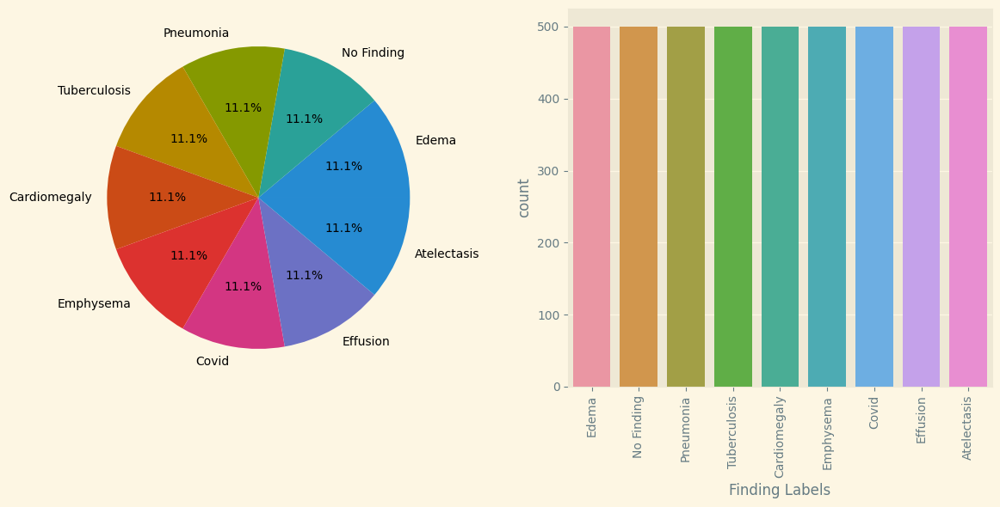

In [11]:
label_counts = df['Finding Labels'].value_counts()

plt.style.use('Solarize_Light2')

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.pie(df['Finding Labels'].value_counts(), labels=label_counts.index, autopct='%.1f%%')
# plt.legend()
plt.subplot(1,2,2)
sns.countplot(x=df['Finding Labels'], order= label_counts.index)
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

**Train & Test Split**

In [12]:
df_train, df_test = train_test_split(df, test_size=0.2, shuffle=True, random_state=42)
df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

**One Hot Encoding**

In [13]:
for col in df['Finding Labels'].unique():
    df_test[col] = np.where(df_test['Finding Labels'].str.contains(col), 1.0, 0.0).astype('float32')
    df_train[col] = np.where(df_train['Finding Labels'].str.contains(col), 1.0, 0.0).astype('float32')
TARGET = df_train.columns[-len(df_all):].tolist()

In [14]:
TARGET

['Edema',
 'No Finding',
 'Pneumonia',
 'Tuberculosis',
 'Cardiomegaly',
 'Emphysema',
 'Covid',
 'Effusion',
 'Atelectasis']

# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>3. Build DataGenerator</b></div>

In [15]:
import albumentations as albu
print(albu.__version__)

1.4.0


In [16]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=16, shuffle=False, augment1=False, augment2=False, preprocess=None, clip_limit=2.0, tile_grid_size=(4,4)):
        super().__init__()
        self.data = data
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.augment1 = augment1
        self.augment2 = augment2
        self.on_epoch_end()
        self.preprocess = preprocess
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size
        self.clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)

    def __len__(self):

        # Drop_Last = False
        ct = int(np.ceil(len(self.data)/self.batch_size))
        return ct

    def __getitem__(self,index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        X, y = self.__data_generation(indexes)
        if self.preprocess != None: X = self.preprocess(X)
        if self.augment1: X = self.__augment1(X)
        if self.augment2: X = self.__augment2(X)
        return X,y

    def on_epoch_end(self,):
        self.indexes = np.arange(len(self.data))
        if self.shuffle: np.random.shuffle(self.indexes)

    def __data_generation(self, indexes):

        X = np.zeros((len(indexes),256,256,3), dtype='float32') 
        y = np.zeros((len(indexes),len(TARGET)), dtype='float32')

        for j,i in enumerate(indexes):
            row = self.data.iloc[i]
            path = row['path']
            img = Image.open(path).convert('L')
            img = img.resize((256,256), Image.Resampling.LANCZOS) # DownSampling
            img = np.array(img) # PIL Object -> np.array(uint8)
            img = self.clahe.apply(img)
            img = np.expand_dims(img, axis=-1)
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB) 

            # FillNaN
            m = np.nanmean(img)
            img = np.nan_to_num(img, nan=m)

            X[j,:,:] = img
            y[j,] = row[TARGET]

        return X,y

    def __augment1(self, img_batch):

        composition = albu.Compose([
            albu.HorizontalFlip(p=0.5),            

        ])

        for i in range(img_batch.shape[0]):
            img = composition(image=img_batch[i,])['image']
            img_batch[i,] = img

        return img_batch


    def __augment2(self, img_batch, mixup_prob=0.1):
        batch_size, height, width, channels = img_batch.shape

        idx = np.random.permutation(batch_size)
        lam = np.random.beta(2.0, 2.0) 

        for i in range(batch_size):
            if np.random.rand() <= mixup_prob:  
                j = idx[i]

                img_batch[i] = img_batch[i] * lam + img_batch[j] * (1-lam)

        return img_batch


# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>4. Build ResNet Model</b></div>

**Install ResNet**

In [17]:
!pip install -q git+https://github.com/qubvel/classification_models.git

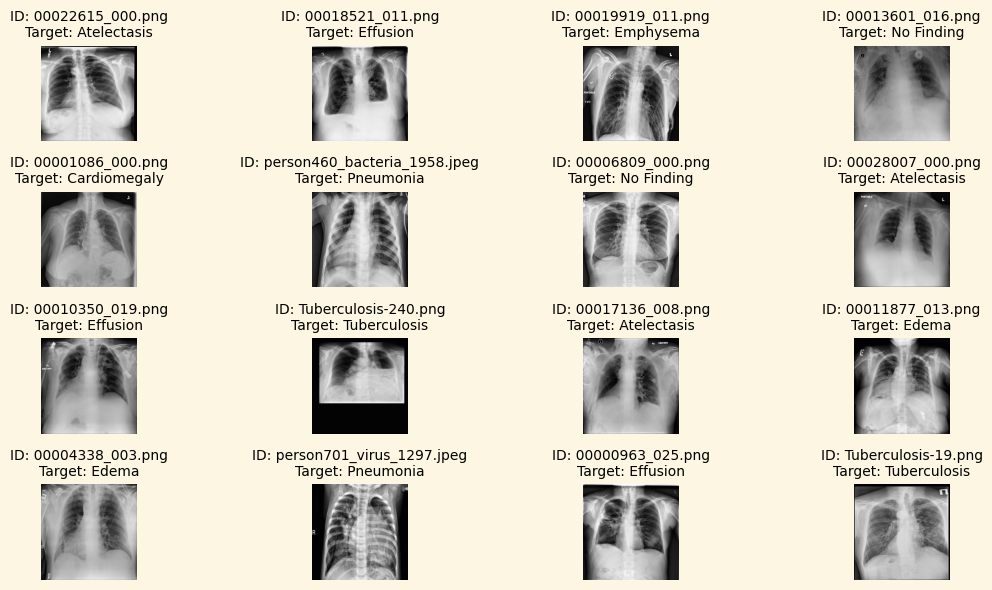

In [18]:
from classification_models.tfkeras import Classifiers

resnet18, preprocess_input = Classifiers.get('resnet18')

ROWS = 4; COLS = 4; BATCHES = 1

gen = DataGenerator(df_train, batch_size=16, shuffle=False, augment1=True, augment2=False, preprocess=None)

for i, (x,y) in enumerate(gen):
    plt.figure(figsize=(12,6))
    for j in range(ROWS):
        for k in range(COLS):
            plt.subplot(ROWS, COLS, j*COLS+k+1)
            img_id = df_train.iloc[i*16+j*COLS+k]['Image Index']
            plt.title(f'ID: {img_id}\nTarget: {df_train.iloc[i*16+j*COLS+k]["Finding Labels"]}', size=10)
            img = x[j*COLS+k,:,:,:3]
            img = img.astype('uint8')
            plt.imshow(img)
            plt.axis('off')
    plt.tight_layout()
    plt.show()
    if i==BATCHES-1: break

#### Macro F1_Score

In [19]:
def temp_f1_score(y_true, y_pred):
    # Calculate the F1 score for each class
    f1_scores = []
    num_classes = K.int_shape(y_pred)[-1]  # (batch_size, output_dims = num_classes)
    
    # Get the true and predicted class indices
    y_true = K.argmax(y_true, axis=-1)
    y_pred = K.argmax(y_pred, axis=-1) # For Label Smoothing(in CCE)

    for i in range(num_classes):
        true_positives = K.sum(K.cast(tf.logical_and(K.equal(y_true, i), K.equal(y_pred, i)), dtype=tf.float32))
        possible_positives = K.sum(K.cast(K.equal(y_true, i), dtype=tf.float32))
        predicted_positives = K.sum(K.cast(K.equal(y_pred, i), dtype=tf.float32))

        recall = true_positives / (possible_positives + K.epsilon())
        precision = true_positives / (predicted_positives + K.epsilon())
        
        f1_score = 2 * ((precision * recall) / (precision + recall + K.epsilon()))
        f1_scores.append(f1_score)
    
    # Calculate the macro-average F1 score
    macro_f1_score = K.mean(tf.stack(f1_scores))
    return macro_f1_score

**ReduceLROnPleateau in Callbacks**

In [20]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

EPOCHS = 10

lr = ReduceLROnPlateau(monitor = 'val_f1_score', factor = 0.1, patience = 1, min_delta = 0.01,
                              mode='max',verbose=1)

In [21]:
def build_model(): 
    inp = tf.keras.layers.Input(shape=(256,256,3)) 
    res_model = resnet18(include_top=False, weights='imagenet', input_shape=(256,256,3)) 
    res_model._name = 'resnet18' 

    ## Freezing Layer(10% Layer)
    for layer in res_model.layers[:len(res_model.layers)//10]:
        layer.trainable = False

    x = res_model(inp)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(len(TARGET), activation='softmax', dtype='float32')(x)

    # Compile
    model = tf.keras.Model(inputs=inp, outputs=x, name='hybrid')

    loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.2)
    opt = tf.keras.optimizers.Adam(learning_rate=1e-3)

    model.compile(loss=loss, optimizer=opt, metrics=['accuracy', temp_f1_score])

    return model

In [22]:
from tensorflow.keras.utils import plot_model

model = build_model()
model.summary()
#plot_model(model, show_shapes=True, show_layer_names=True, expand_nested=True)

44920640/44920640 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "hybrid"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional (Functional)         │ (None, 8, 8, 512)      │    11,186,889 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 9)              │         4,617 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,191,506 (42.69 MB)

 Trainable params: 11,174,025 (42.63 MB)

 Non-trainable params: 17,481 (68.29 KB)

#### StratifiedKFold

In [23]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for i, (_, valid_index) in enumerate(skf.split(df_train, df_train['Finding Labels'])):
    df_train.loc[valid_index, 'Fold'] = i

In [24]:
from sklearn.metrics import accuracy_score, f1_score, roc_curve, auc

Training with CLAHE settings: clip_limit=1.0, tile_grid_size=(2, 2)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 169s 726ms/step - accuracy: 0.3102 - loss: 2.1918 - temp_f1_score: 0.1812 - val_accuracy: 0.3722 - val_loss: 2.4194 - val_temp_f1_score: 0.2559 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 481ms/step - accuracy: 0.4837 - loss: 1.7467 - temp_f1_score: 0.2872 - val_accuracy: 0.5139 - val_loss: 1.7527 - val_temp_f1_score: 0.3806 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 484ms/step - accuracy: 0.5197 - loss: 1.6839 - temp_f1_score: 0.3098 - val_accuracy: 0.3833 - val_loss: 2.1553 - val_temp_f1_score: 0.2213 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 482ms/step - accuracy: 0.5761 - loss: 1.6148 - temp_f1_score: 0.3543 - val_accuracy: 0.5278 - val_loss: 1.6897 - val_temp_f1_score: 0.3800 - learning_rate: 0.0010
Epoc

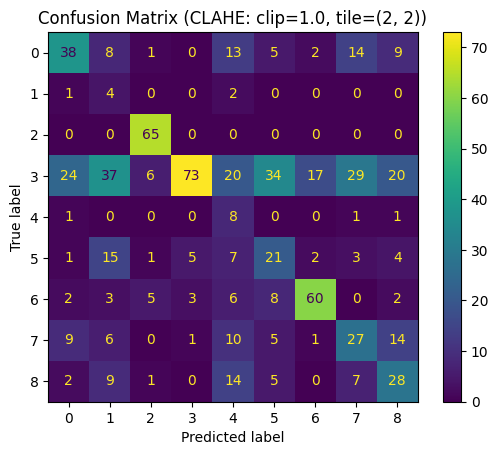

Accuracy for Validation Set = 0.45
F1 Score for Validation Set = 0.42173701108850126
Training with CLAHE settings: clip_limit=1.0, tile_grid_size=(4, 4)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 498ms/step - accuracy: 0.3437 - loss: 2.2035 - temp_f1_score: 0.2001 - val_accuracy: 0.3972 - val_loss: 2.0355 - val_temp_f1_score: 0.2678 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 483ms/step - accuracy: 0.4730 - loss: 1.7476 - temp_f1_score: 0.2772 - val_accuracy: 0.3722 - val_loss: 2.2927 - val_temp_f1_score: 0.2463 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 480ms/step - accuracy: 0.5094 - loss: 1.7092 - temp_f1_score: 0.3042 - val_accuracy: 0.4361 - val_loss: 1.9352 - val_temp_f1_score: 0.2890 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 481ms/step - accuracy: 0.5795 - loss: 1.6227 - temp_f1_score: 0.3494 - val_accurac

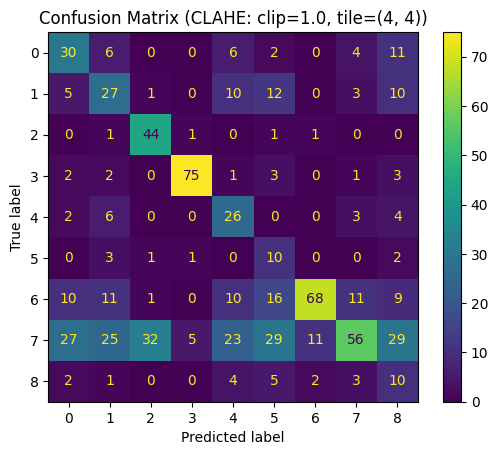

Accuracy for Validation Set = 0.48055555555555557
F1 Score for Validation Set = 0.46502806621728354
Training with CLAHE settings: clip_limit=1.0, tile_grid_size=(8, 8)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 504ms/step - accuracy: 0.3258 - loss: 2.2151 - temp_f1_score: 0.1931 - val_accuracy: 0.3639 - val_loss: 2.3893 - val_temp_f1_score: 0.2415 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 477ms/step - accuracy: 0.4870 - loss: 1.7466 - temp_f1_score: 0.2945 - val_accuracy: 0.4472 - val_loss: 2.1314 - val_temp_f1_score: 0.2972 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 476ms/step - accuracy: 0.5088 - loss: 1.7011 - temp_f1_score: 0.3033 - val_accuracy: 0.4444 - val_loss: 1.9264 - val_temp_f1_score: 0.3114 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 483ms/step - accuracy: 0.5628 - loss: 1.6067 - temp_f1_score: 0.342

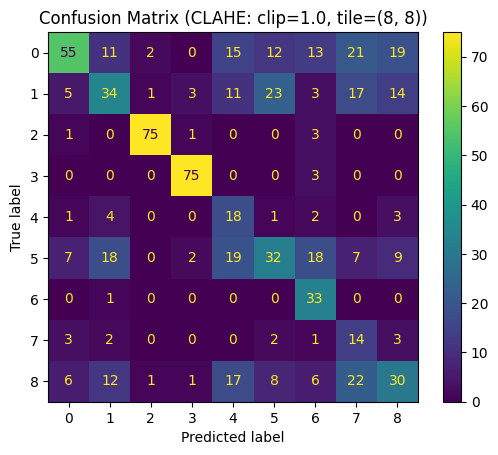

Accuracy for Validation Set = 0.5083333333333333
F1 Score for Validation Set = 0.5057421115905855
Training with CLAHE settings: clip_limit=2, tile_grid_size=(2, 2)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 502ms/step - accuracy: 0.3598 - loss: 2.1449 - temp_f1_score: 0.2141 - val_accuracy: 0.4000 - val_loss: 2.0821 - val_temp_f1_score: 0.3043 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 483ms/step - accuracy: 0.4677 - loss: 1.7623 - temp_f1_score: 0.2710 - val_accuracy: 0.4139 - val_loss: 1.9622 - val_temp_f1_score: 0.2861 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 480ms/step - accuracy: 0.5038 - loss: 1.7268 - temp_f1_score: 0.2944 - val_accuracy: 0.3750 - val_loss: 2.0781 - val_temp_f1_score: 0.2455 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 481ms/step - accuracy: 0.5409 - loss: 1.6346 - temp_f1_score: 0.3325 - 

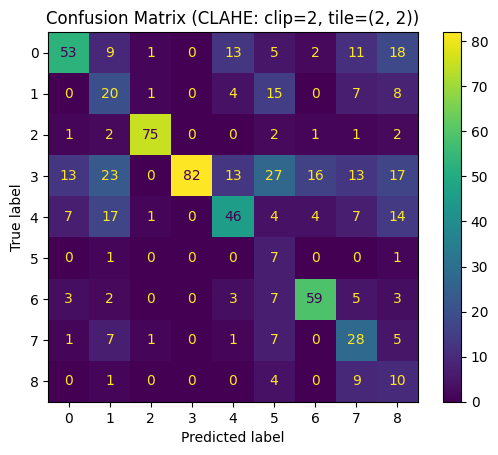

Accuracy for Validation Set = 0.5277777777777778
F1 Score for Validation Set = 0.4842933006474916
Training with CLAHE settings: clip_limit=2, tile_grid_size=(4, 4)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 122s 500ms/step - accuracy: 0.3474 - loss: 2.1576 - temp_f1_score: 0.2017 - val_accuracy: 0.4472 - val_loss: 2.0888 - val_temp_f1_score: 0.2892 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 482ms/step - accuracy: 0.4569 - loss: 1.7773 - temp_f1_score: 0.2711 - val_accuracy: 0.3750 - val_loss: 2.2941 - val_temp_f1_score: 0.2643 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 481ms/step - accuracy: 0.5079 - loss: 1.7027 - temp_f1_score: 0.3059 - val_accuracy: 0.4111 - val_loss: 2.1635 - val_temp_f1_score: 0.2918 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 479ms/step - accuracy: 0.5524 - loss: 1.6471 - temp_f1_score: 0.3320 - 

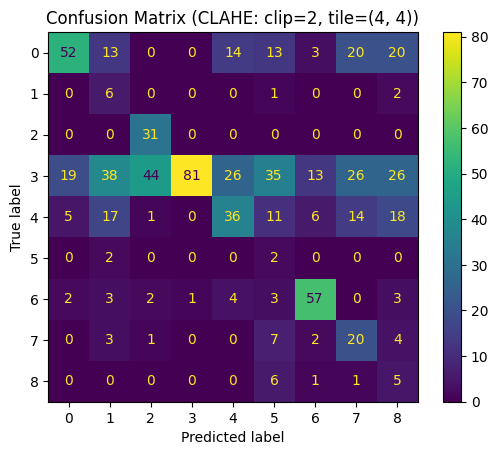

Accuracy for Validation Set = 0.4027777777777778
F1 Score for Validation Set = 0.35621100481282914
Training with CLAHE settings: clip_limit=2, tile_grid_size=(8, 8)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 122s 501ms/step - accuracy: 0.3474 - loss: 2.2283 - temp_f1_score: 0.1985 - val_accuracy: 0.3750 - val_loss: 2.4366 - val_temp_f1_score: 0.2539 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 480ms/step - accuracy: 0.4779 - loss: 1.7619 - temp_f1_score: 0.2787 - val_accuracy: 0.3833 - val_loss: 1.9014 - val_temp_f1_score: 0.2650 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 485ms/step - accuracy: 0.5193 - loss: 1.6796 - temp_f1_score: 0.3141 - val_accuracy: 0.4333 - val_loss: 2.0727 - val_temp_f1_score: 0.2881 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 482ms/step - accuracy: 0.5445 - loss: 1.6509 - temp_f1_score: 0.3297 -

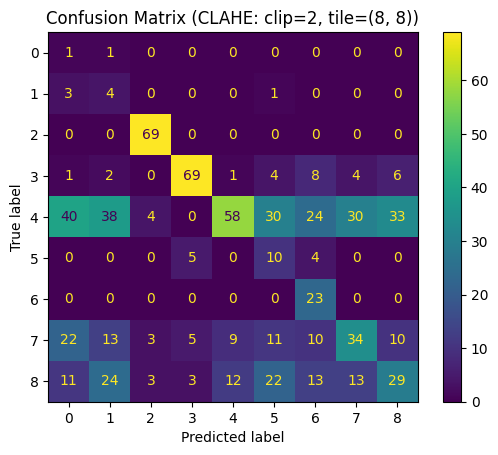

Accuracy for Validation Set = 0.4125
F1 Score for Validation Set = 0.3818619211675723
Training with CLAHE settings: clip_limit=0, tile_grid_size=(2, 2)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 507ms/step - accuracy: 0.3408 - loss: 2.2085 - temp_f1_score: 0.1976 - val_accuracy: 0.3722 - val_loss: 2.3382 - val_temp_f1_score: 0.2546 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 484ms/step - accuracy: 0.4721 - loss: 1.7873 - temp_f1_score: 0.2798 - val_accuracy: 0.4167 - val_loss: 1.9651 - val_temp_f1_score: 0.2832 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 92s 497ms/step - accuracy: 0.5079 - loss: 1.7146 - temp_f1_score: 0.3060 - val_accuracy: 0.3806 - val_loss: 2.0816 - val_temp_f1_score: 0.2747 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 483ms/step - accuracy: 0.5511 - loss: 1.6704 - temp_f1_score: 0.3247 - val_accuracy

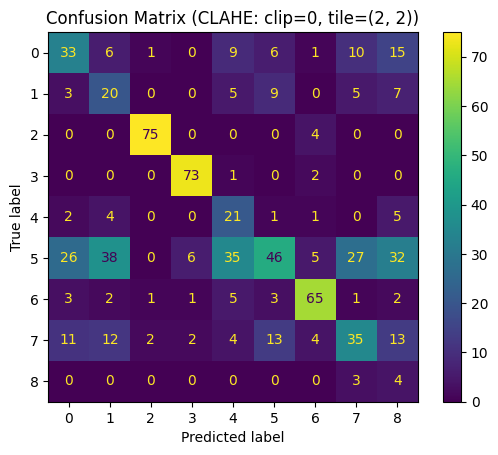

Accuracy for Validation Set = 0.5166666666666667
F1 Score for Validation Set = 0.5059718289123705
Training with CLAHE settings: clip_limit=0, tile_grid_size=(4, 4)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 504ms/step - accuracy: 0.3506 - loss: 2.1548 - temp_f1_score: 0.2065 - val_accuracy: 0.3500 - val_loss: 2.3004 - val_temp_f1_score: 0.2220 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 477ms/step - accuracy: 0.4821 - loss: 1.7380 - temp_f1_score: 0.2810 - val_accuracy: 0.3472 - val_loss: 2.2403 - val_temp_f1_score: 0.2175 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 480ms/step - accuracy: 0.5380 - loss: 1.6579 - temp_f1_score: 0.3201 - val_accuracy: 0.5111 - val_loss: 1.7491 - val_temp_f1_score: 0.3761 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 481ms/step - accuracy: 0.5276 - loss: 1.6650 - temp_f1_score: 0.3094 - 

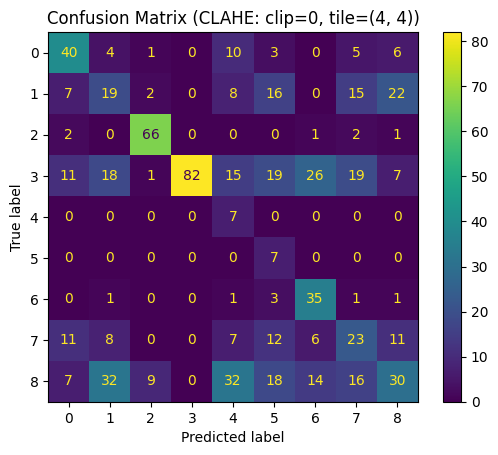

Accuracy for Validation Set = 0.42916666666666664
F1 Score for Validation Set = 0.40666815514367866
Training with CLAHE settings: clip_limit=0, tile_grid_size=(8, 8)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 502ms/step - accuracy: 0.3394 - loss: 2.2423 - temp_f1_score: 0.2048 - val_accuracy: 0.4222 - val_loss: 1.9661 - val_temp_f1_score: 0.2881 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 482ms/step - accuracy: 0.4748 - loss: 1.7430 - temp_f1_score: 0.2771 - val_accuracy: 0.2694 - val_loss: 2.1300 - val_temp_f1_score: 0.1727 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 477ms/step - accuracy: 0.5444 - loss: 1.6463 - temp_f1_score: 0.3295 - val_accuracy: 0.4111 - val_loss: 2.2129 - val_temp_f1_score: 0.2827 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 484ms/step - accuracy: 0.5566 - loss: 1.6198 - temp_f1_score: 0.3477 

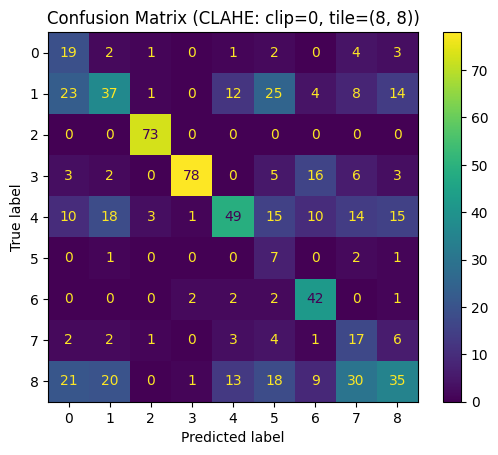

Accuracy for Validation Set = 0.49583333333333335
F1 Score for Validation Set = 0.4801391402494428
Training with CLAHE settings: clip_limit=3, tile_grid_size=(2, 2)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 505ms/step - accuracy: 0.3380 - loss: 2.1928 - temp_f1_score: 0.1952 - val_accuracy: 0.3972 - val_loss: 2.0505 - val_temp_f1_score: 0.2477 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 482ms/step - accuracy: 0.4683 - loss: 1.7630 - temp_f1_score: 0.2751 - val_accuracy: 0.2611 - val_loss: 2.1821 - val_temp_f1_score: 0.1433 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 481ms/step - accuracy: 0.5102 - loss: 1.6970 - temp_f1_score: 0.3063 - val_accuracy: 0.3139 - val_loss: 2.6199 - val_temp_f1_score: 0.1759 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 480ms/step - accuracy: 0.5436 - loss: 1.6445 - temp_f1_score: 0.3355 -

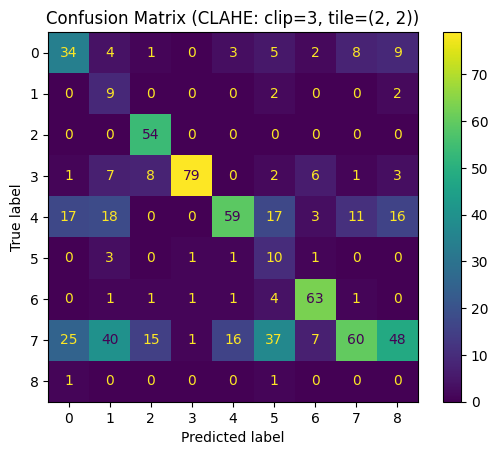

Accuracy for Validation Set = 0.5111111111111111
F1 Score for Validation Set = 0.4709139564942506
Training with CLAHE settings: clip_limit=3, tile_grid_size=(4, 4)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 504ms/step - accuracy: 0.3364 - loss: 2.1771 - temp_f1_score: 0.2005 - val_accuracy: 0.2694 - val_loss: 2.8807 - val_temp_f1_score: 0.1782 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 480ms/step - accuracy: 0.4705 - loss: 1.7483 - temp_f1_score: 0.2800 - val_accuracy: 0.4111 - val_loss: 1.8506 - val_temp_f1_score: 0.2909 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 481ms/step - accuracy: 0.5302 - loss: 1.6501 - temp_f1_score: 0.3248 - val_accuracy: 0.2611 - val_loss: 2.0542 - val_temp_f1_score: 0.1558 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 473ms/step - accuracy: 0.5408 - loss: 1.6496 - temp_f1_score: 0.3299 - 

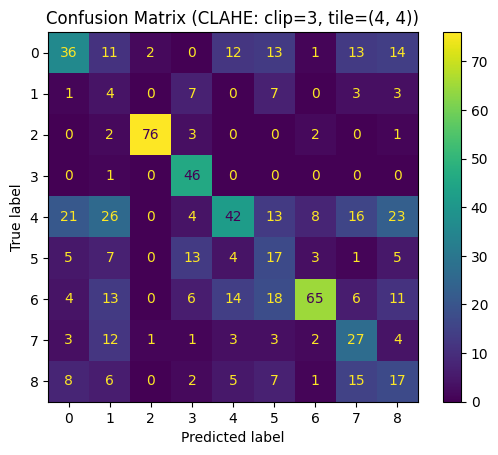

Accuracy for Validation Set = 0.4583333333333333
F1 Score for Validation Set = 0.4409984791961303
Training with CLAHE settings: clip_limit=3, tile_grid_size=(8, 8)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 505ms/step - accuracy: 0.3156 - loss: 2.1727 - temp_f1_score: 0.1850 - val_accuracy: 0.1778 - val_loss: 3.3957 - val_temp_f1_score: 0.0847 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 480ms/step - accuracy: 0.4600 - loss: 1.7611 - temp_f1_score: 0.2707 - val_accuracy: 0.2389 - val_loss: 2.7165 - val_temp_f1_score: 0.1483 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 480ms/step - accuracy: 0.5264 - loss: 1.6833 - temp_f1_score: 0.3196 - val_accuracy: 0.4639 - val_loss: 1.8778 - val_temp_f1_score: 0.3276 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 482ms/step - accuracy: 0.5412 - loss: 1.6642 - temp_f1_score: 0.3260 - 

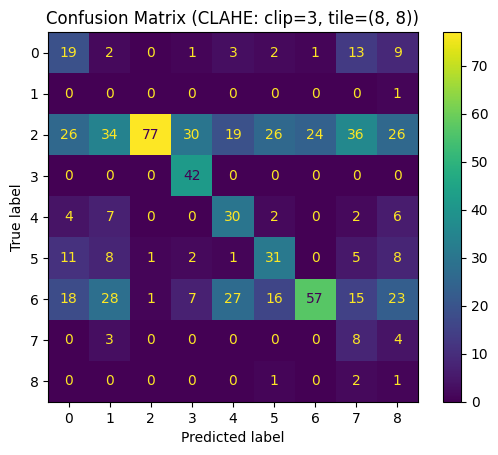

Accuracy for Validation Set = 0.3680555555555556
F1 Score for Validation Set = 0.3194999108112223
Training with CLAHE settings: clip_limit=0, tile_grid_size=(2, 2)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 504ms/step - accuracy: 0.3548 - loss: 2.1511 - temp_f1_score: 0.2059 - val_accuracy: 0.2194 - val_loss: 3.0895 - val_temp_f1_score: 0.1341 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 482ms/step - accuracy: 0.4505 - loss: 1.7718 - temp_f1_score: 0.2732 - val_accuracy: 0.4833 - val_loss: 1.8385 - val_temp_f1_score: 0.3524 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 482ms/step - accuracy: 0.5003 - loss: 1.6948 - temp_f1_score: 0.2974 - val_accuracy: 0.5417 - val_loss: 1.7731 - val_temp_f1_score: 0.3943 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 479ms/step - accuracy: 0.5252 - loss: 1.6627 - temp_f1_score: 0.3159 - 

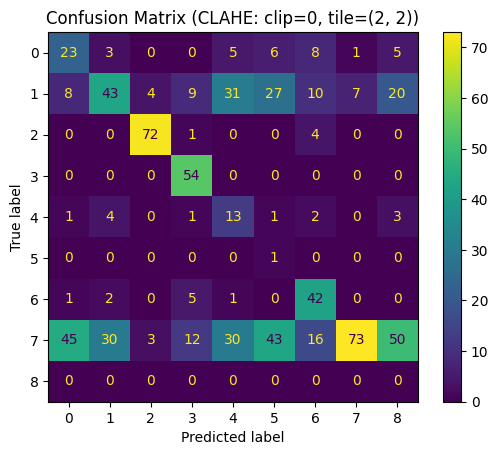

Accuracy for Validation Set = 0.44583333333333336
F1 Score for Validation Set = 0.41292729839130093
Training with CLAHE settings: clip_limit=0, tile_grid_size=(4, 4)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 503ms/step - accuracy: 0.3440 - loss: 2.2076 - temp_f1_score: 0.2004 - val_accuracy: 0.3972 - val_loss: 2.0782 - val_temp_f1_score: 0.2644 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 484ms/step - accuracy: 0.4671 - loss: 1.7359 - temp_f1_score: 0.2714 - val_accuracy: 0.4417 - val_loss: 1.7729 - val_temp_f1_score: 0.3142 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 141s 482ms/step - accuracy: 0.5126 - loss: 1.7053 - temp_f1_score: 0.3051 - val_accuracy: 0.4861 - val_loss: 1.7498 - val_temp_f1_score: 0.3475 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 483ms/step - accuracy: 0.5338 - loss: 1.6591 - temp_f1_score: 0.3246

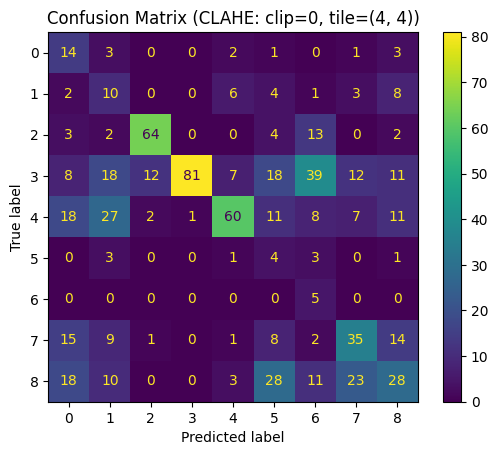

Accuracy for Validation Set = 0.41805555555555557
F1 Score for Validation Set = 0.35734991066832955
Training with CLAHE settings: clip_limit=0, tile_grid_size=(8, 8)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 505ms/step - accuracy: 0.3157 - loss: 2.2046 - temp_f1_score: 0.1882 - val_accuracy: 0.3917 - val_loss: 2.0829 - val_temp_f1_score: 0.2959 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 476ms/step - accuracy: 0.4588 - loss: 1.7728 - temp_f1_score: 0.2706 - val_accuracy: 0.3972 - val_loss: 2.0907 - val_temp_f1_score: 0.2751 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 483ms/step - accuracy: 0.5151 - loss: 1.6963 - temp_f1_score: 0.3088 - val_accuracy: 0.4083 - val_loss: 2.0142 - val_temp_f1_score: 0.2778 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 484ms/step - accuracy: 0.5458 - loss: 1.6517 - temp_f1_score: 0.3285 

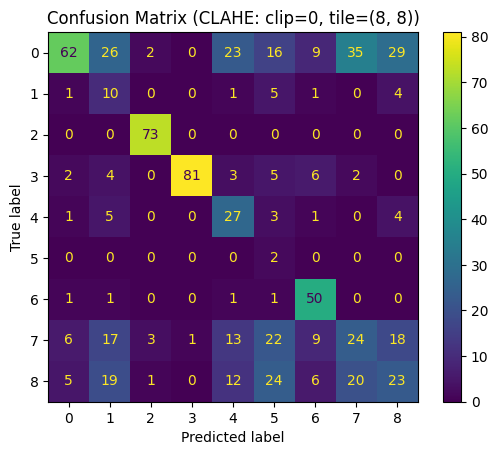

Accuracy for Validation Set = 0.4888888888888889
F1 Score for Validation Set = 0.46611616305430903
Training with CLAHE settings: clip_limit=4, tile_grid_size=(2, 2)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 509ms/step - accuracy: 0.3381 - loss: 2.1748 - temp_f1_score: 0.2015 - val_accuracy: 0.3528 - val_loss: 2.0398 - val_temp_f1_score: 0.2473 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 482ms/step - accuracy: 0.4827 - loss: 1.7594 - temp_f1_score: 0.2852 - val_accuracy: 0.4056 - val_loss: 2.3258 - val_temp_f1_score: 0.2631 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 485ms/step - accuracy: 0.5147 - loss: 1.6973 - temp_f1_score: 0.3025 - val_accuracy: 0.3167 - val_loss: 2.7033 - val_temp_f1_score: 0.1758 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 487ms/step - accuracy: 0.5744 - loss: 1.6053 - temp_f1_score: 0.3405 -

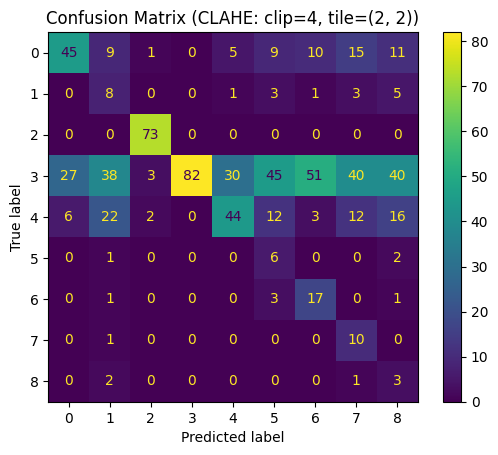

Accuracy for Validation Set = 0.4
F1 Score for Validation Set = 0.35360812431599775
Training with CLAHE settings: clip_limit=4, tile_grid_size=(4, 4)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 504ms/step - accuracy: 0.3249 - loss: 2.1763 - temp_f1_score: 0.1915 - val_accuracy: 0.4194 - val_loss: 2.0538 - val_temp_f1_score: 0.2902 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 476ms/step - accuracy: 0.4714 - loss: 1.7549 - temp_f1_score: 0.2790 - val_accuracy: 0.1806 - val_loss: 5.2211 - val_temp_f1_score: 0.0931 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 481ms/step - accuracy: 0.5040 - loss: 1.7151 - temp_f1_score: 0.3008 - val_accuracy: 0.2167 - val_loss: 2.4642 - val_temp_f1_score: 0.1050 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 481ms/step - accuracy: 0.5625 - loss: 1.6261 - temp_f1_score: 0.3430 - val_accuracy: 

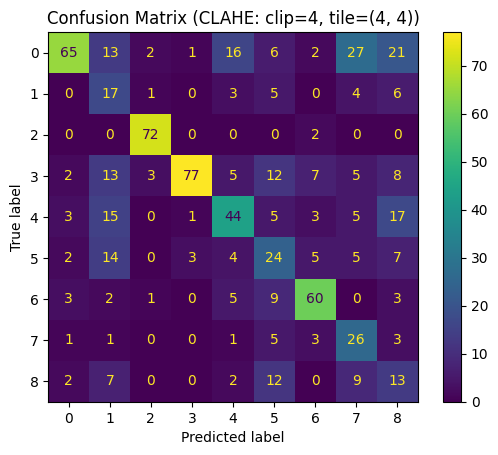

Accuracy for Validation Set = 0.5527777777777778
F1 Score for Validation Set = 0.5252015990287002
Training with CLAHE settings: clip_limit=4, tile_grid_size=(8, 8)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 504ms/step - accuracy: 0.3364 - loss: 2.1713 - temp_f1_score: 0.1957 - val_accuracy: 0.3250 - val_loss: 2.4371 - val_temp_f1_score: 0.2162 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 483ms/step - accuracy: 0.4790 - loss: 1.7495 - temp_f1_score: 0.2829 - val_accuracy: 0.4556 - val_loss: 1.7917 - val_temp_f1_score: 0.3090 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 483ms/step - accuracy: 0.5209 - loss: 1.6883 - temp_f1_score: 0.3023 - val_accuracy: 0.4500 - val_loss: 1.8032 - val_temp_f1_score: 0.3263 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 484ms/step - accuracy: 0.5581 - loss: 1.6535 - temp_f1_score: 0.3355 - 

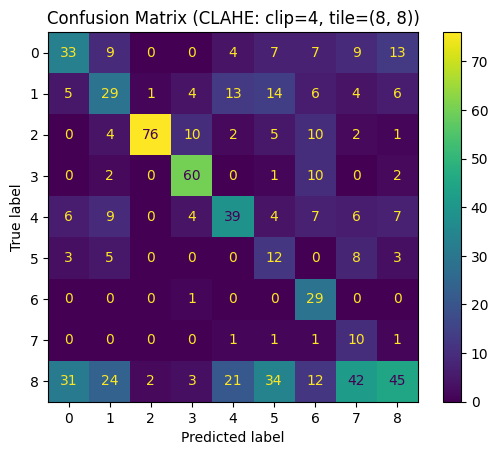

Accuracy for Validation Set = 0.4625
F1 Score for Validation Set = 0.45255446171756386
Training with CLAHE settings: clip_limit=0, tile_grid_size=(2, 2)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 124s 506ms/step - accuracy: 0.3365 - loss: 2.1536 - temp_f1_score: 0.2001 - val_accuracy: 0.3806 - val_loss: 2.4436 - val_temp_f1_score: 0.2481 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 485ms/step - accuracy: 0.4661 - loss: 1.7669 - temp_f1_score: 0.2810 - val_accuracy: 0.3528 - val_loss: 3.1028 - val_temp_f1_score: 0.2673 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 91s 490ms/step - accuracy: 0.4953 - loss: 1.7086 - temp_f1_score: 0.2911 - val_accuracy: 0.2444 - val_loss: 2.4433 - val_temp_f1_score: 0.1474 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 91s 489ms/step - accuracy: 0.5647 - loss: 1.6113 - temp_f1_score: 0.3363 - val_accurac

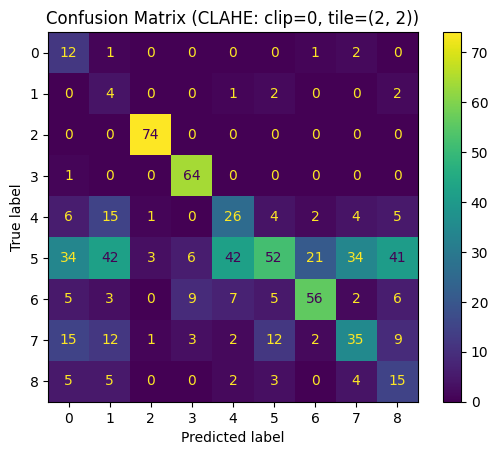

Accuracy for Validation Set = 0.46944444444444444
F1 Score for Validation Set = 0.4615986235583138
Training with CLAHE settings: clip_limit=0, tile_grid_size=(4, 4)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 506ms/step - accuracy: 0.3467 - loss: 2.2231 - temp_f1_score: 0.2057 - val_accuracy: 0.4722 - val_loss: 2.0328 - val_temp_f1_score: 0.3344 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 482ms/step - accuracy: 0.4974 - loss: 1.7252 - temp_f1_score: 0.3007 - val_accuracy: 0.3861 - val_loss: 2.1583 - val_temp_f1_score: 0.2676 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 479ms/step - accuracy: 0.4951 - loss: 1.7102 - temp_f1_score: 0.3035 - val_accuracy: 0.3528 - val_loss: 2.0929 - val_temp_f1_score: 0.2091 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 91s 490ms/step - accuracy: 0.5395 - loss: 1.6450 - temp_f1_score: 0.3240 -

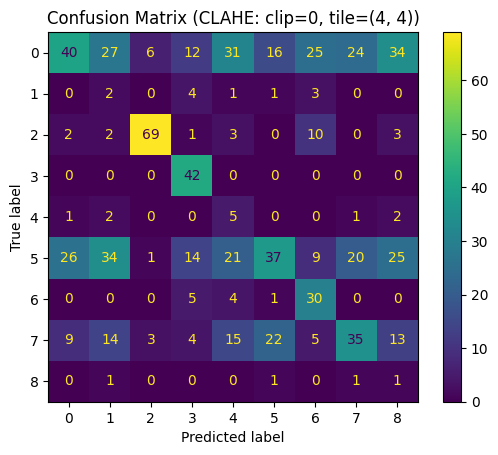

Accuracy for Validation Set = 0.3625
F1 Score for Validation Set = 0.34040259105487547
Training with CLAHE settings: clip_limit=0, tile_grid_size=(8, 8)
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 124s 506ms/step - accuracy: 0.2933 - loss: 2.2052 - temp_f1_score: 0.1653 - val_accuracy: 0.3583 - val_loss: 2.2274 - val_temp_f1_score: 0.2530 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 483ms/step - accuracy: 0.4884 - loss: 1.7389 - temp_f1_score: 0.2893 - val_accuracy: 0.4472 - val_loss: 1.9962 - val_temp_f1_score: 0.3071 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 484ms/step - accuracy: 0.5123 - loss: 1.6894 - temp_f1_score: 0.3085 - val_accuracy: 0.4444 - val_loss: 1.8814 - val_temp_f1_score: 0.3085 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 90s 486ms/step - accuracy: 0.5528 - loss: 1.6331 - temp_f1_score: 0.3327 - val_accurac

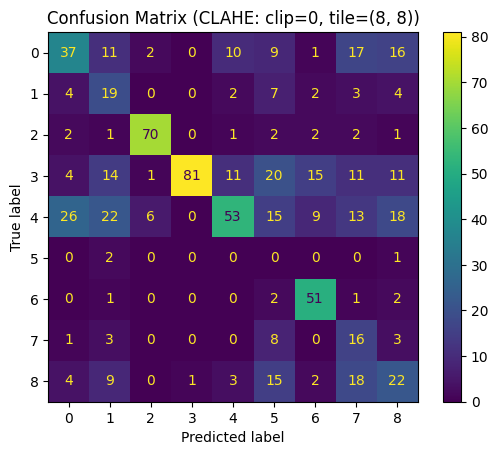

Accuracy for Validation Set = 0.4847222222222222
F1 Score for Validation Set = 0.4430889241030154


In [25]:
import tensorflow.keras.backend as K
from collections import defaultdict

clip_limits = [1.0,2,0,3,0,4,0]
tile_grid_sizes = [(2,2), (4,4),(8,8)]
results = []

for clip_limit in clip_limits:
    for tile_grid_size in tile_grid_sizes:
        print(f"Training with CLAHE settings: clip_limit={clip_limit}, tile_grid_size={tile_grid_size}")
        
        all_oof = []
        all_true = []
        all_index = []
        all_history = defaultdict(list)

        for i in range(1):  # 나중에 fold 수를 변경할 수 있도록 유지
            print('#'*25)
            print(f'### Fold {i+1}')
            
            train_gen = DataGenerator(df_train[df_train['Fold'] != i], shuffle=True, augment1=True, augment2=False, 
                                      batch_size=16, preprocess=preprocess_input, 
                                      clip_limit=clip_limit, tile_grid_size=tile_grid_size)
            valid_gen = DataGenerator(df_train[df_train['Fold'] == i], shuffle=False, batch_size=32, 
                                      preprocess=preprocess_input,
                                      clip_limit=clip_limit, tile_grid_size=tile_grid_size)
            
            print(f'### train size {len(df_train[df_train["Fold"] != i])}, valid size {len(df_train[df_train["Fold"] == i])}')
            print('#'*25)
            
            K.clear_session()
            with strategy.scope():
                model = build_model()
            
            if LOAD_MODELS_FROM is None:
                history = model.fit(train_gen, verbose=1,
                          validation_data=valid_gen,
                          epochs=EPOCHS, callbacks=[lr])
                model.save_weights(f'ResNet_f{i}_clip{clip_limit}_tile{tile_grid_size[0]}.weights.h5')
                all_history['Train Loss'].append(history.history['loss'])
                all_history['Valid Loss'].append(history.history['val_loss'])
                all_history['Valid F1'].append(history.history['val_temp_f1_score'])
                all_history['Train F1'].append(history.history['temp_f1_score'])
                all_history['Valid Accuracy'].append(history.history['val_accuracy'])
                all_history['Train Accuracy'].append(history.history['accuracy'])
            else:
                model.load_weights(f'{LOAD_MODELS_FROM}ResNet_f{i}_clip{clip_limit}_tile{tile_grid_size[0]}.weights.h5')
            
            oof = model.predict(valid_gen, verbose=1)
            all_oof.append(oof)
            all_true.append(df_train[df_train['Fold'] == i][TARGET].values)
            all_index.append(df_train[df_train['Fold'] == i]['Image Index'].values)
            
            plt.style.use('default')
            cm = confusion_matrix(np.argmax(oof, axis=1), np.argmax(df_train[df_train['Fold'] == i][TARGET].values, axis=1), labels=[x for x in range(len(TARGET))])
            disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                      display_labels=[x for x in range(len(TARGET))])  
            disp.plot()
            plt.title(f'Confusion Matrix (CLAHE: clip={clip_limit}, tile={tile_grid_size})')
            plt.show()
            
            del model, oof
            gc.collect()
        
        all_oof = np.concatenate(all_oof)
        all_true = np.concatenate(all_true)
        all_index = np.concatenate(all_index)
        
        # 성능 평가 및 결과 저장
        accuracy = accuracy_score(np.argmax(all_true, axis=1), np.argmax(all_oof, axis=1))
        f1 = f1_score(np.argmax(all_true, axis=1), np.argmax(all_oof, axis=1), average='macro')
        
        print(f'Accuracy for Validation Set = {accuracy}')
        print(f'F1 Score for Validation Set = {f1}')
        
        results.append({
            'clip_limit': clip_limit,
            'tile_grid_size': tile_grid_size,
            'accuracy': accuracy,
            'f1_score': f1,
            'all_history': all_history,
            'all_oof': all_oof,
            'all_true': all_true,
            'all_index': all_index
        })
        
        del train_gen, valid_gen
        gc.collect()

<Figure size 1200x1000 with 0 Axes>

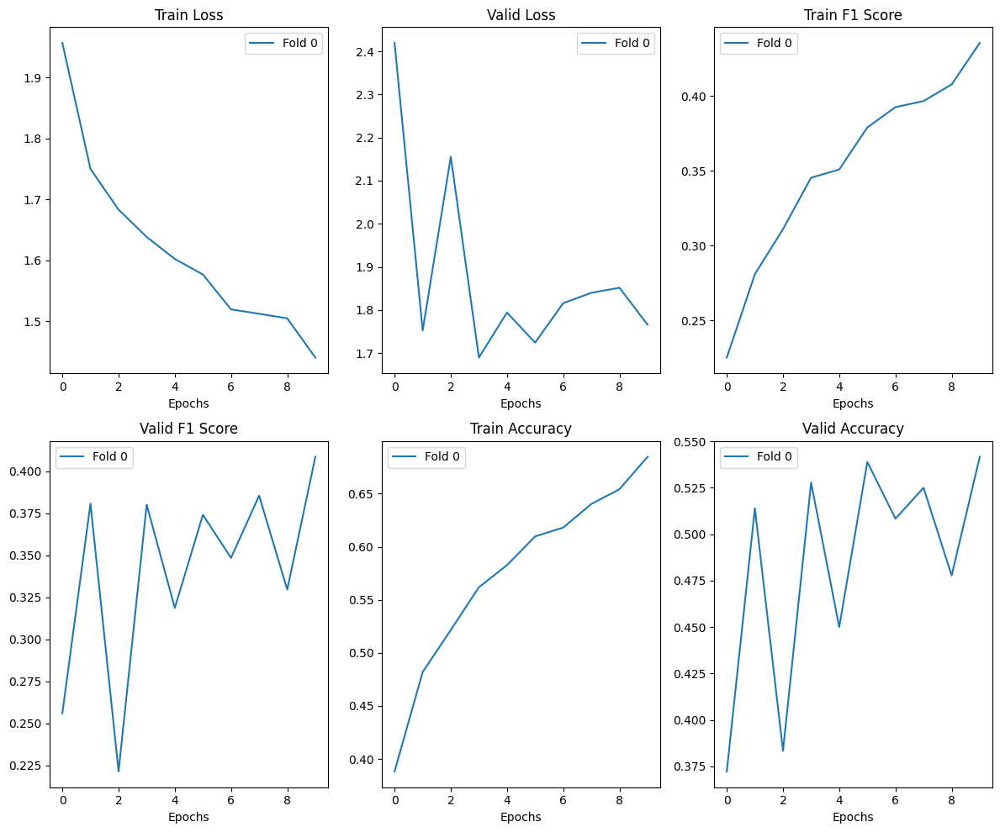

<Figure size 1200x1000 with 0 Axes>

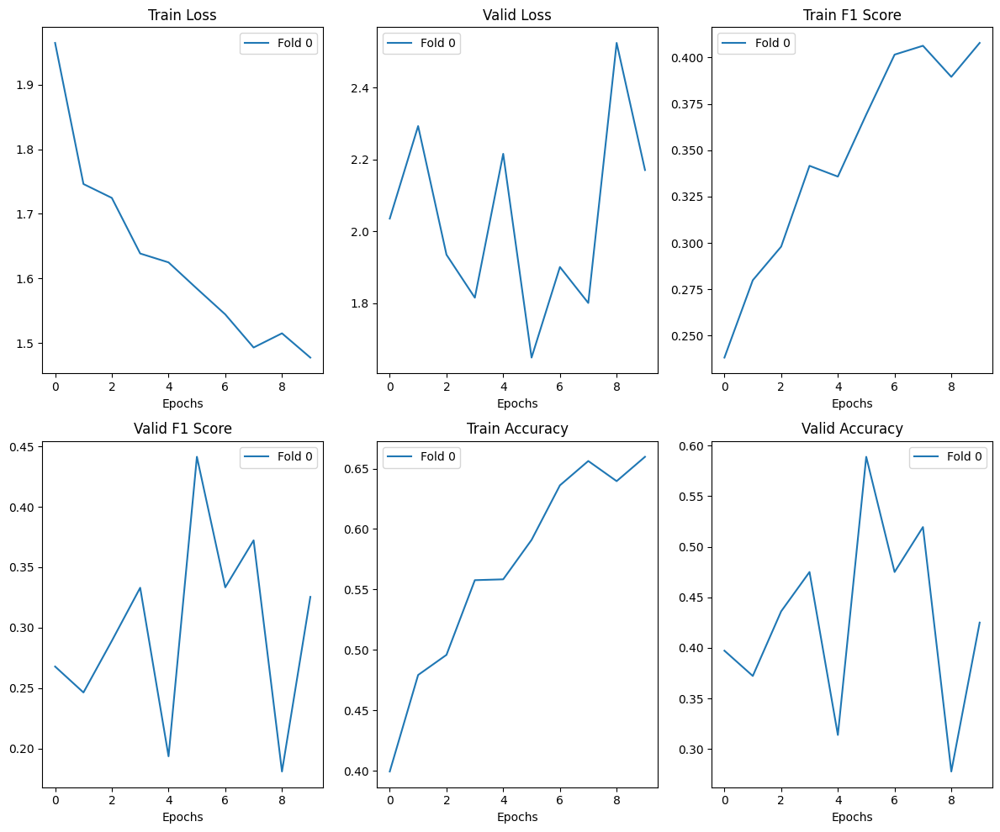

<Figure size 1200x1000 with 0 Axes>

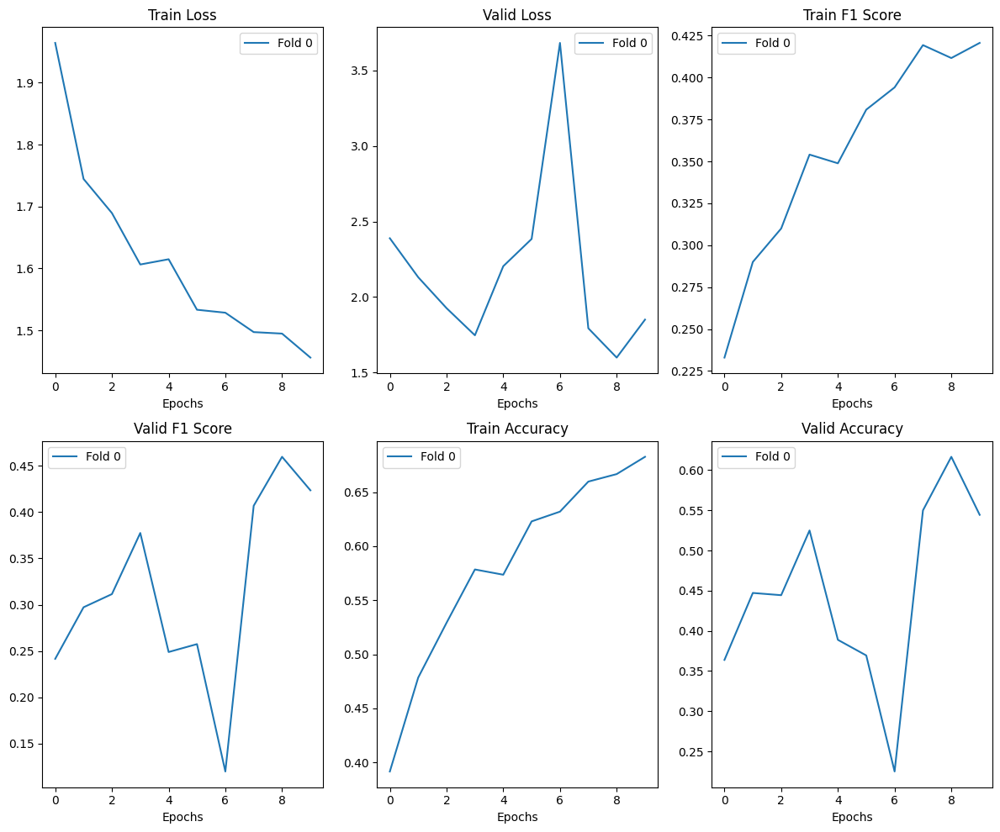

<Figure size 1200x1000 with 0 Axes>

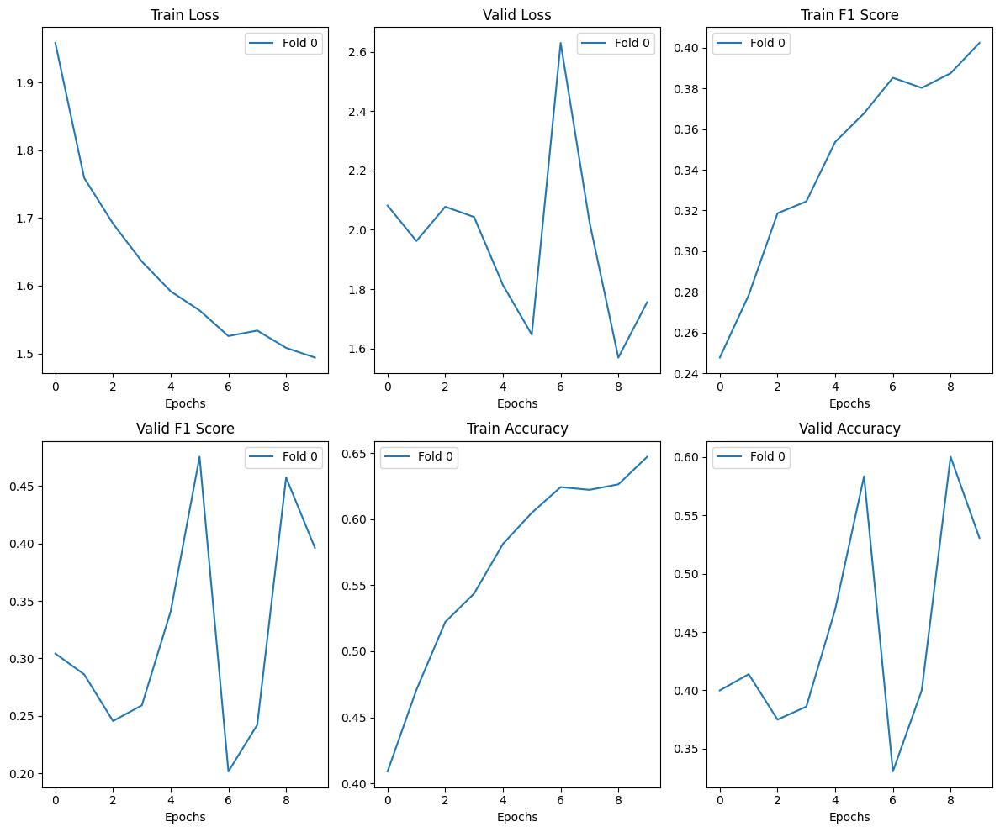

<Figure size 1200x1000 with 0 Axes>

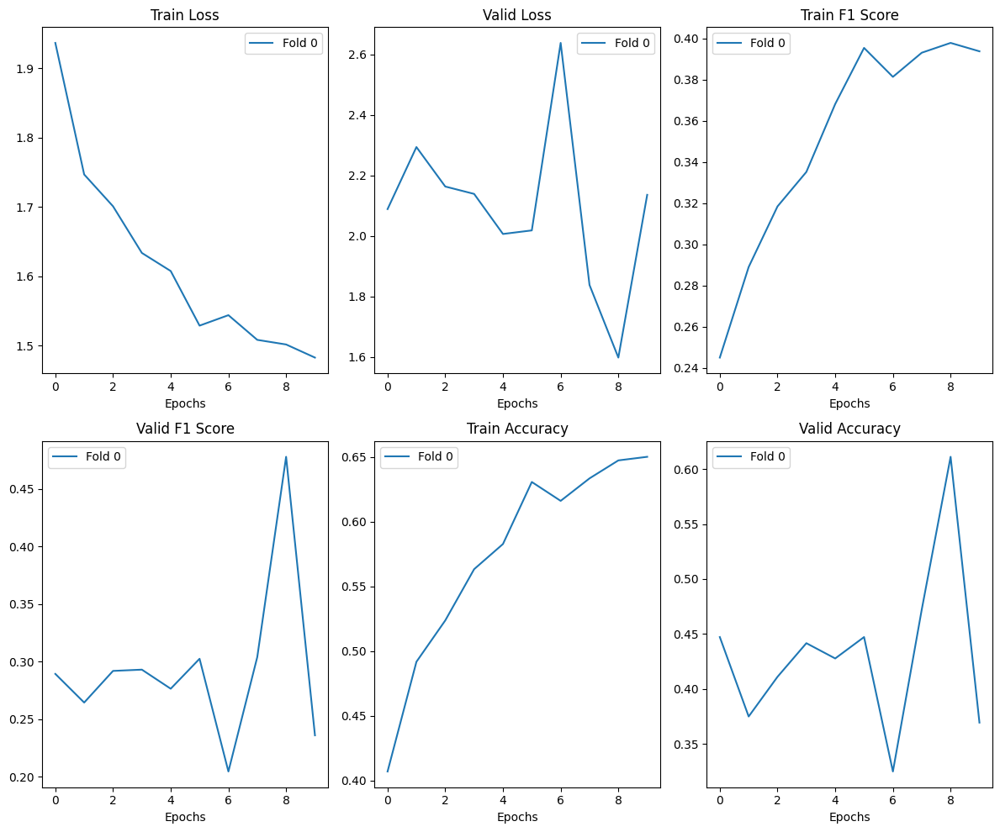

<Figure size 1200x1000 with 0 Axes>

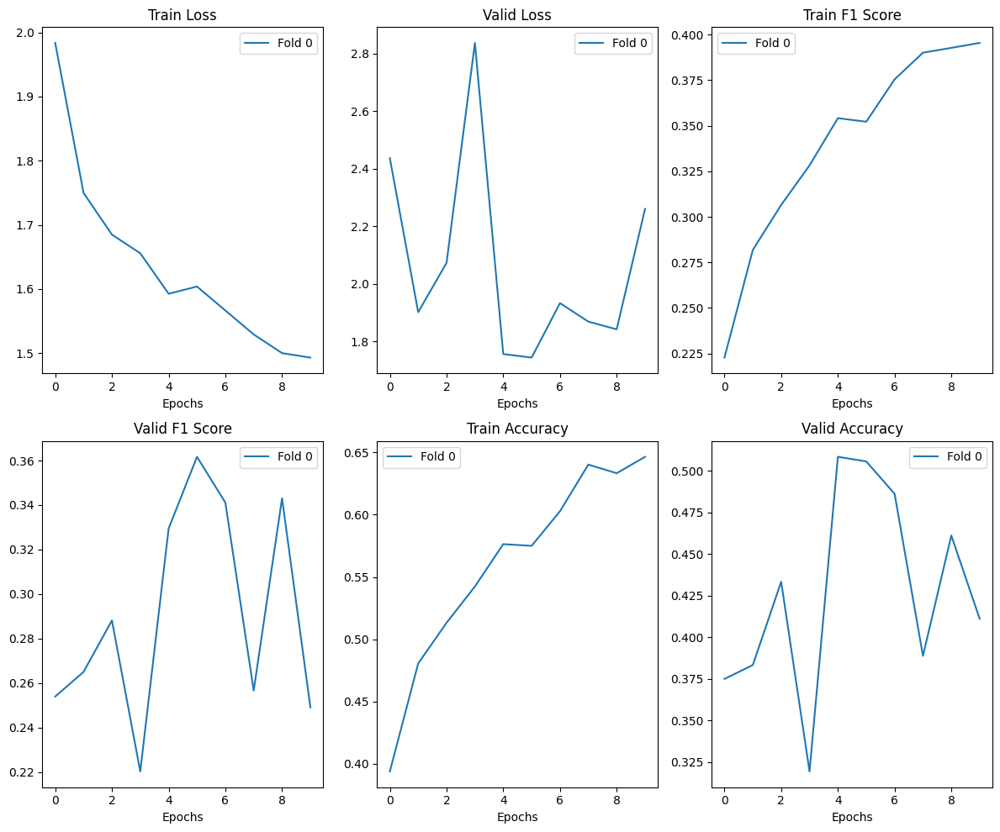

<Figure size 1200x1000 with 0 Axes>

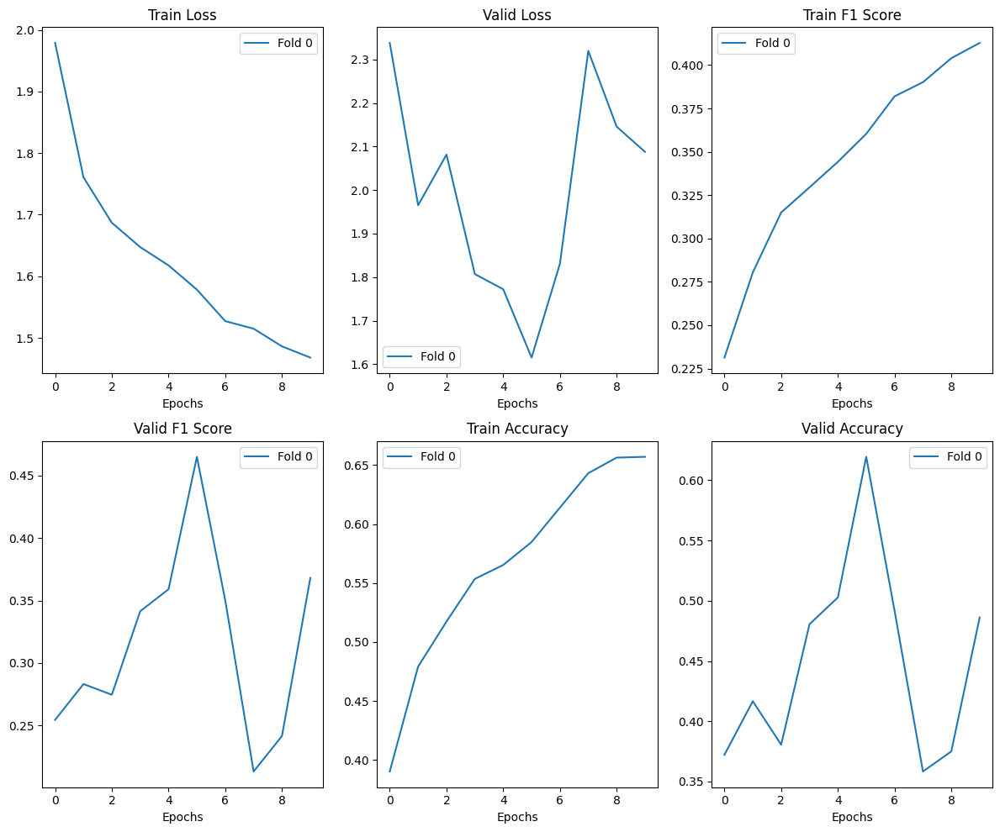

<Figure size 1200x1000 with 0 Axes>

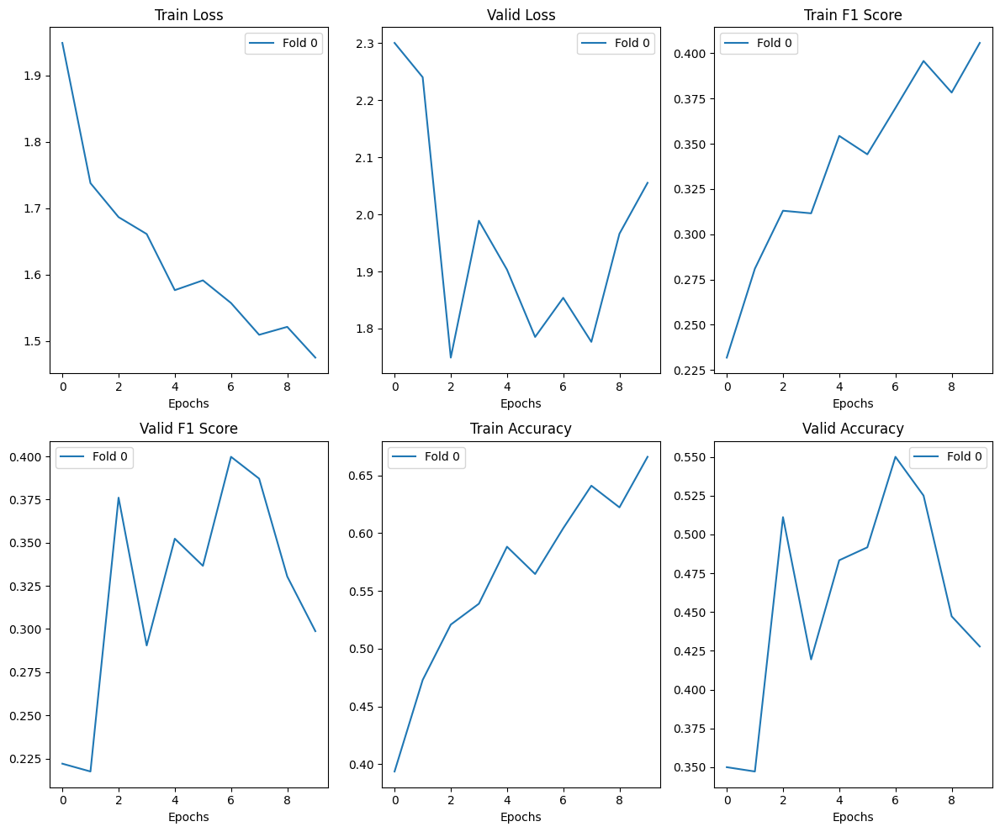

<Figure size 1200x1000 with 0 Axes>

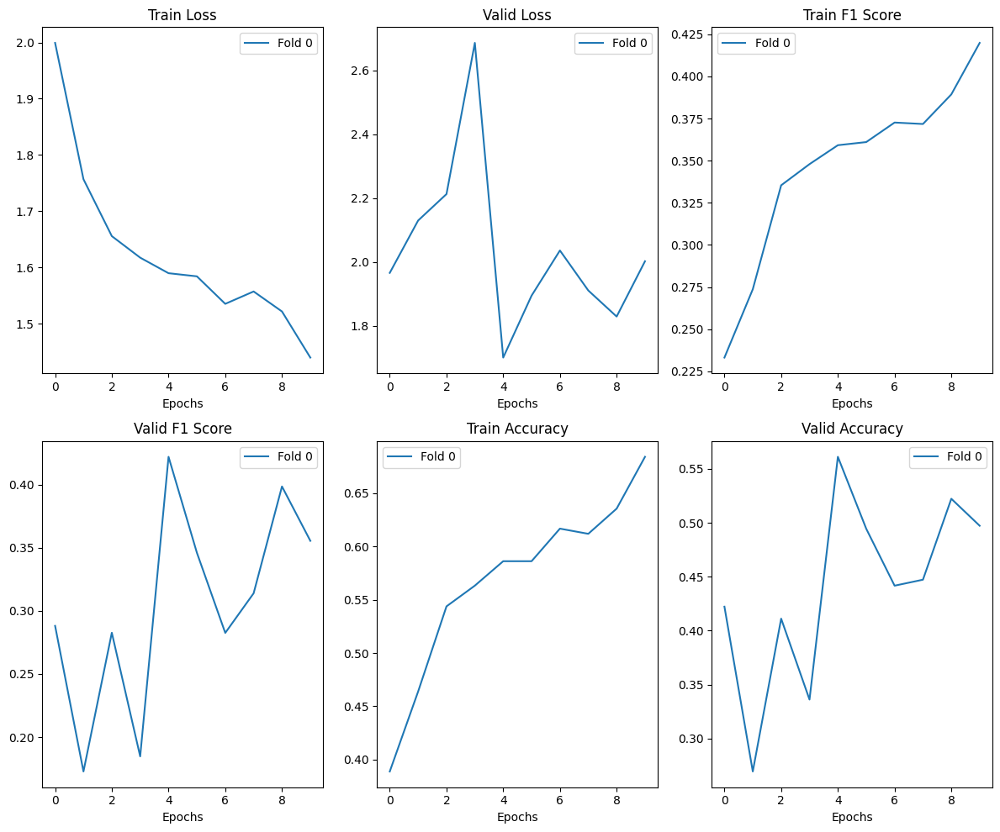

<Figure size 1200x1000 with 0 Axes>

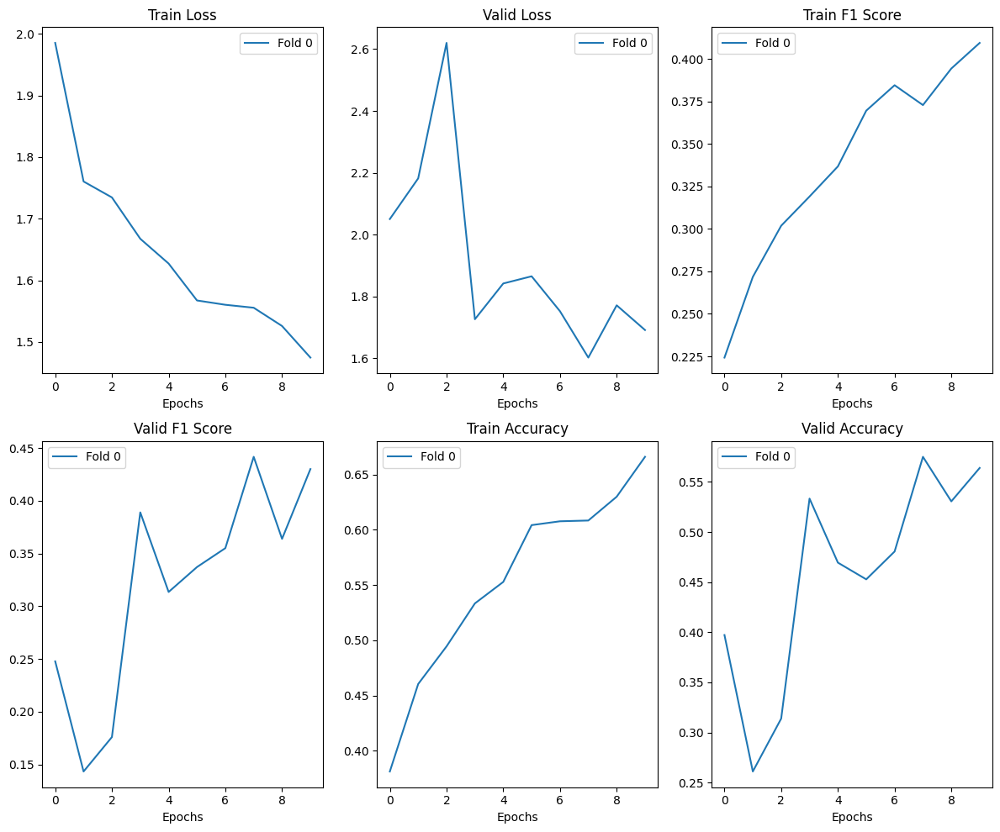

<Figure size 1200x1000 with 0 Axes>

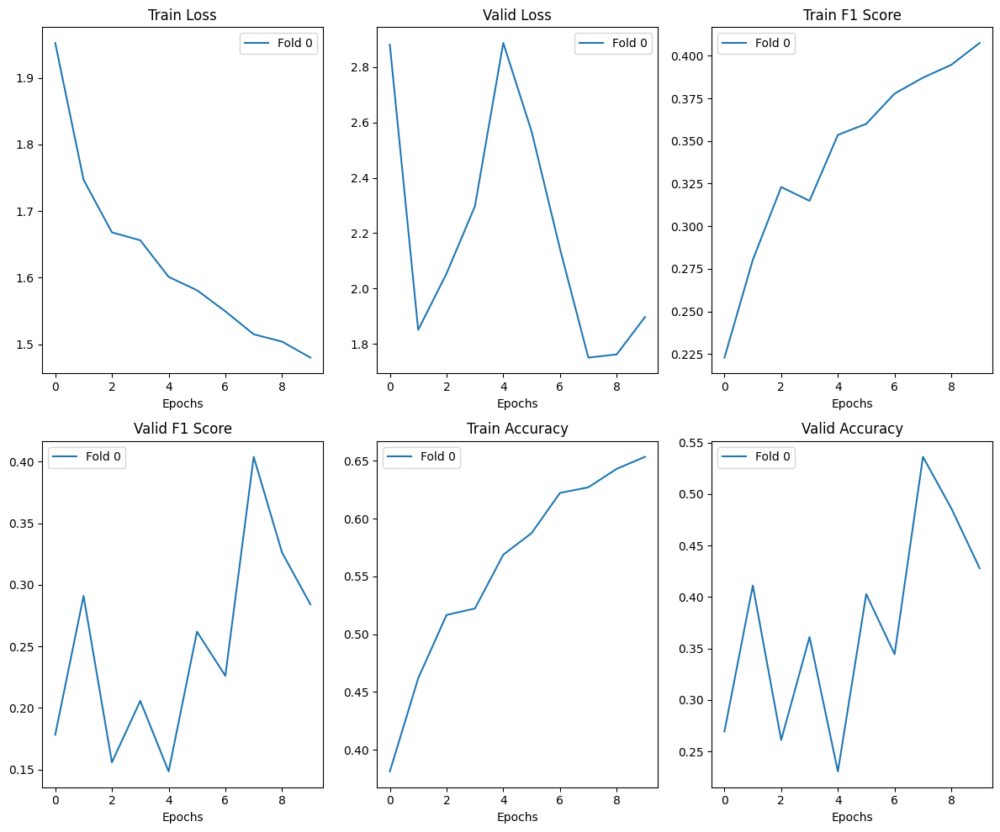

<Figure size 1200x1000 with 0 Axes>

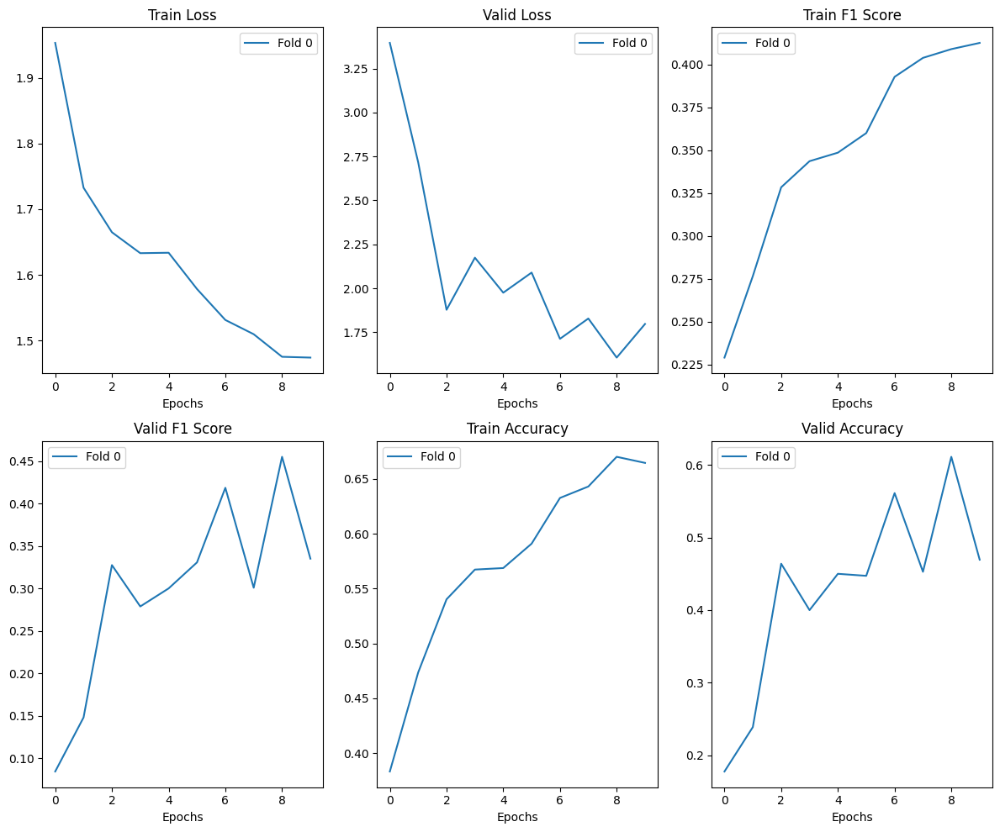

<Figure size 1200x1000 with 0 Axes>

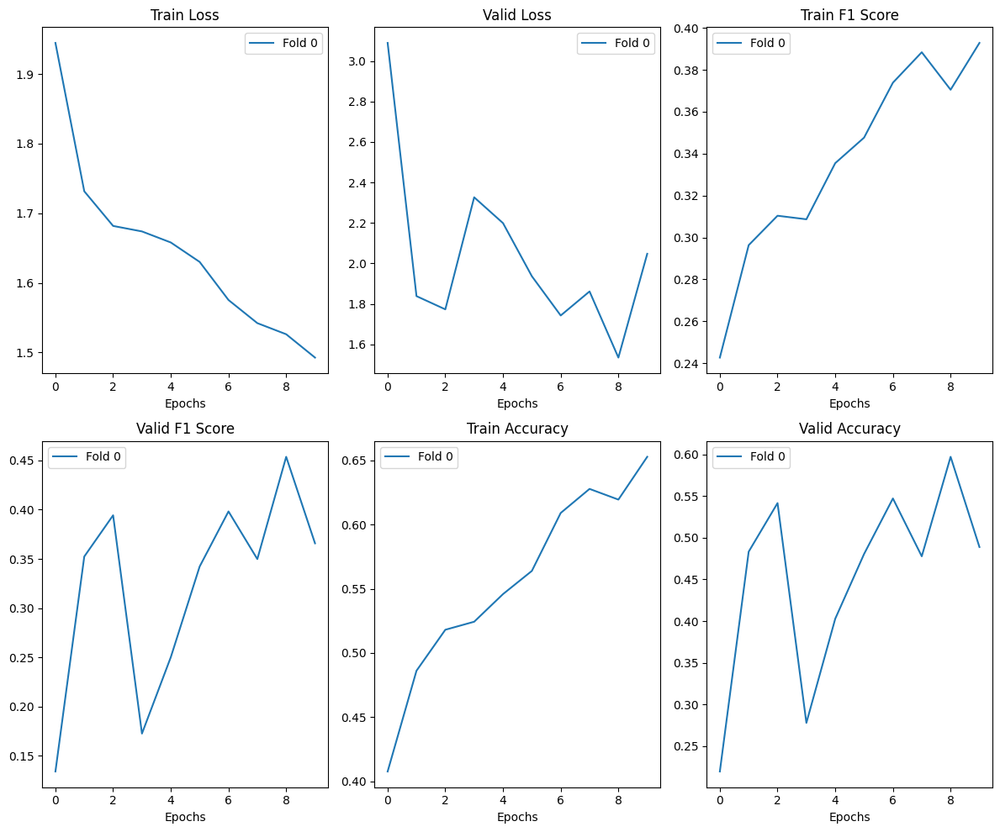

<Figure size 1200x1000 with 0 Axes>

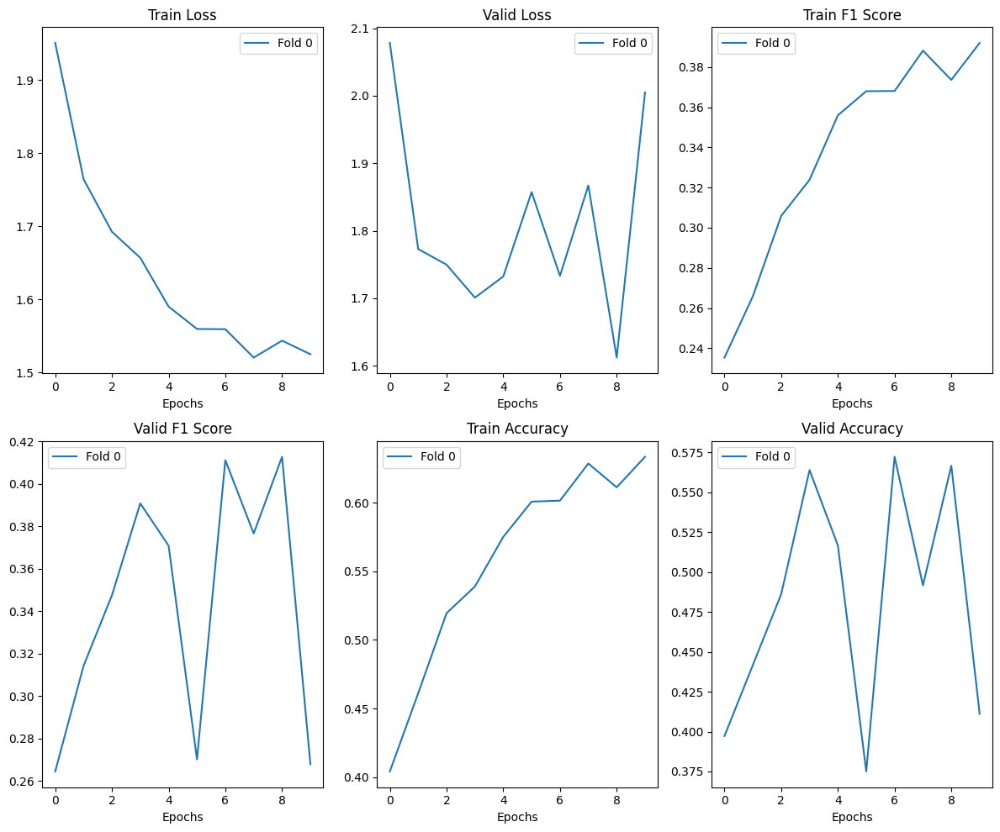

<Figure size 1200x1000 with 0 Axes>

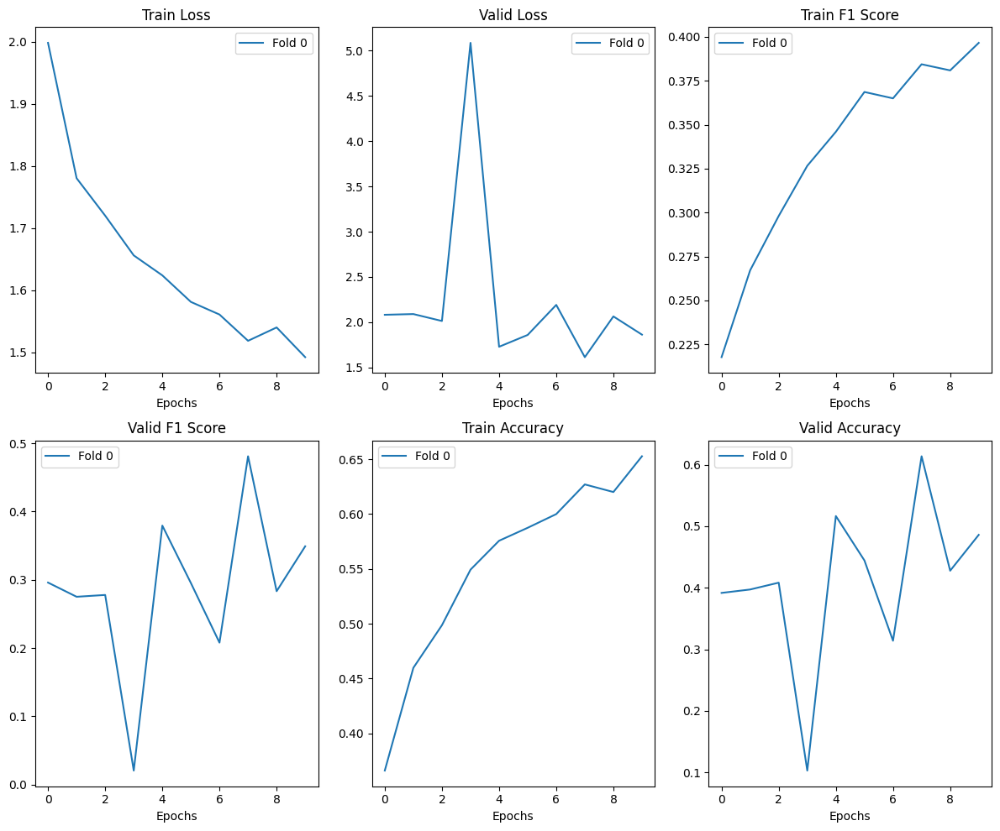

<Figure size 1200x1000 with 0 Axes>

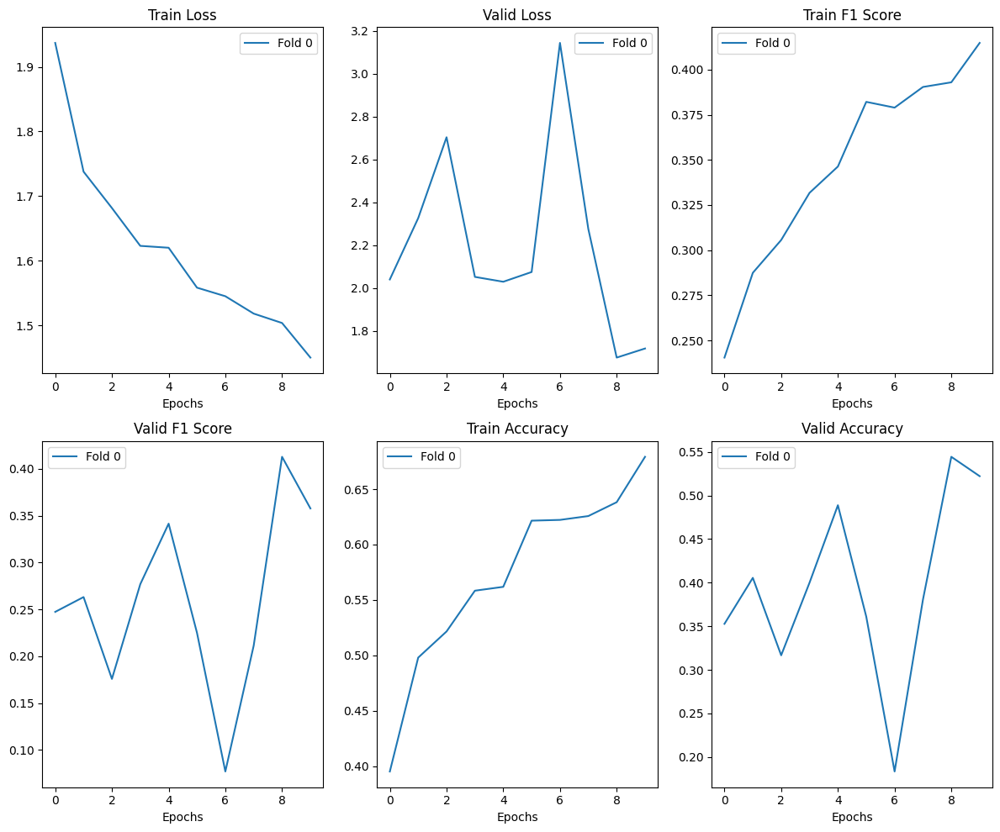

<Figure size 1200x1000 with 0 Axes>

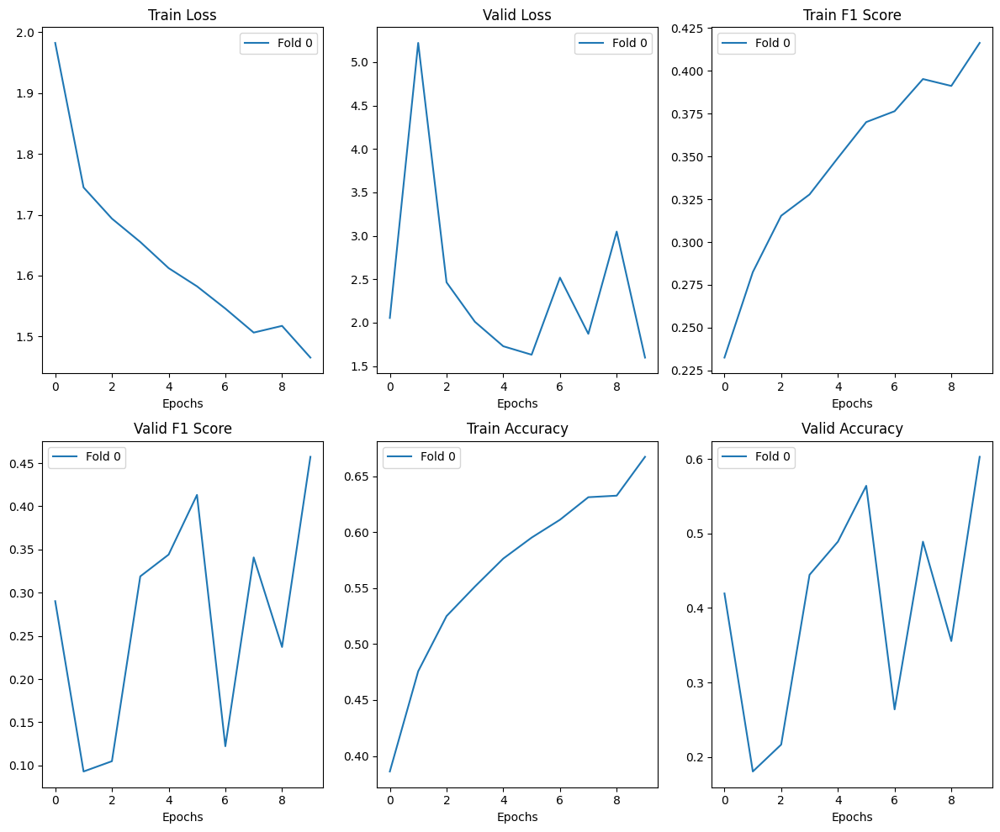

<Figure size 1200x1000 with 0 Axes>

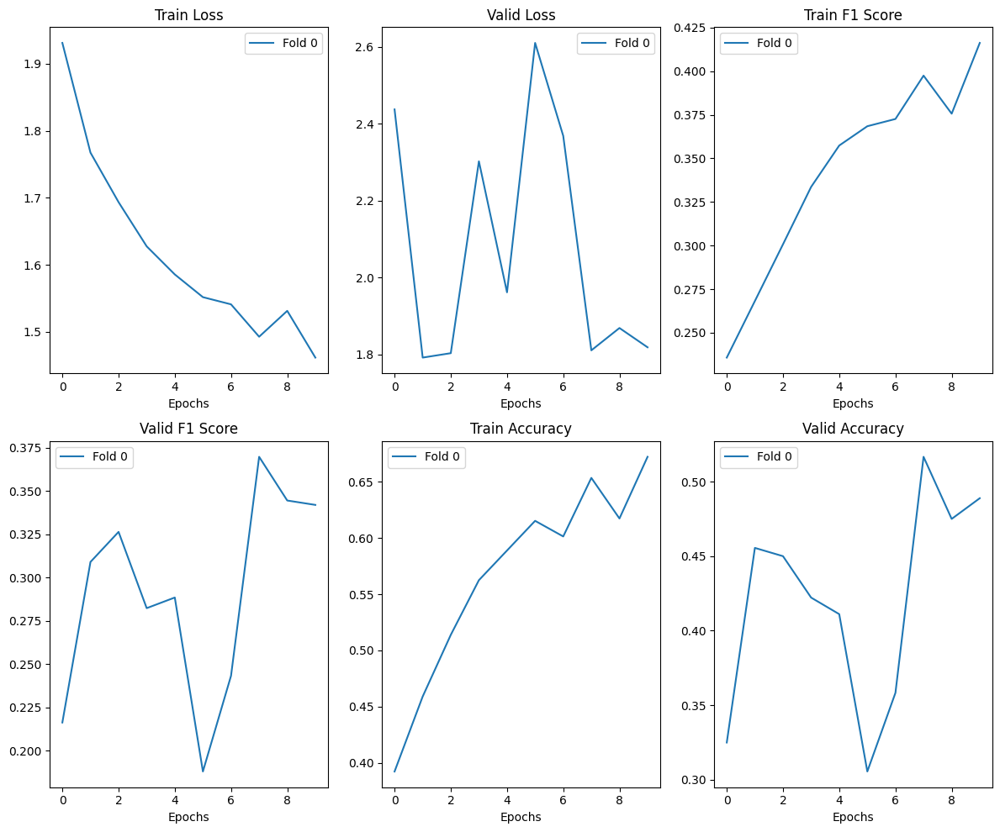

<Figure size 1200x1000 with 0 Axes>

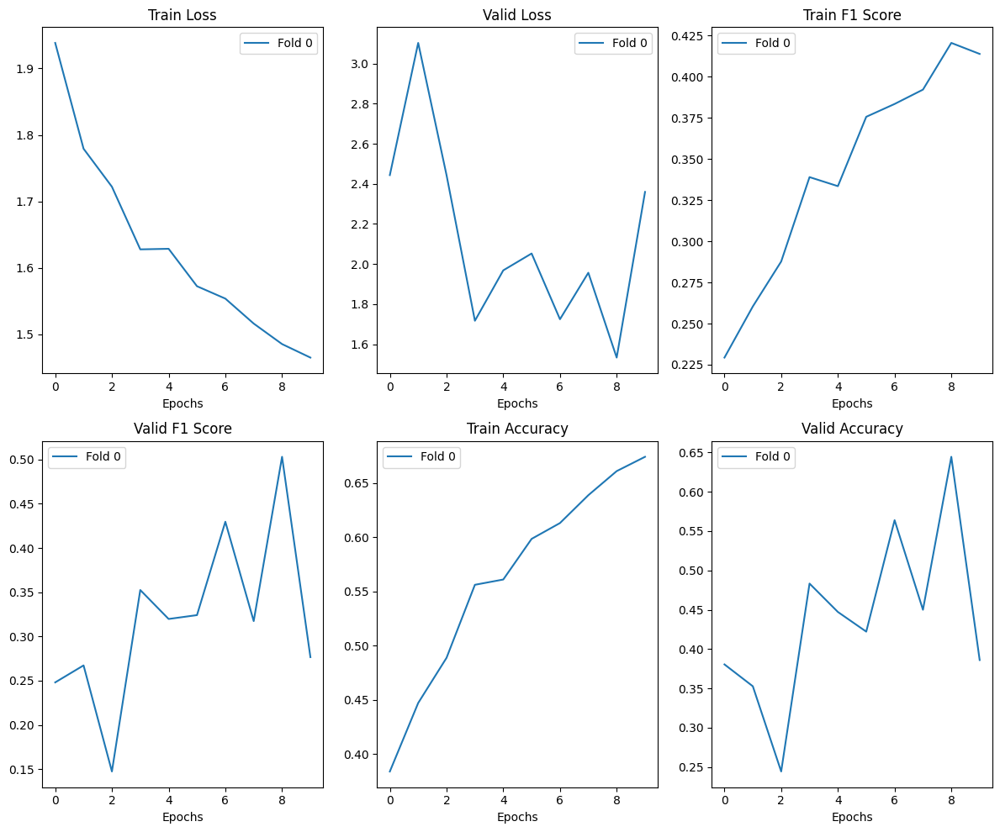

<Figure size 1200x1000 with 0 Axes>

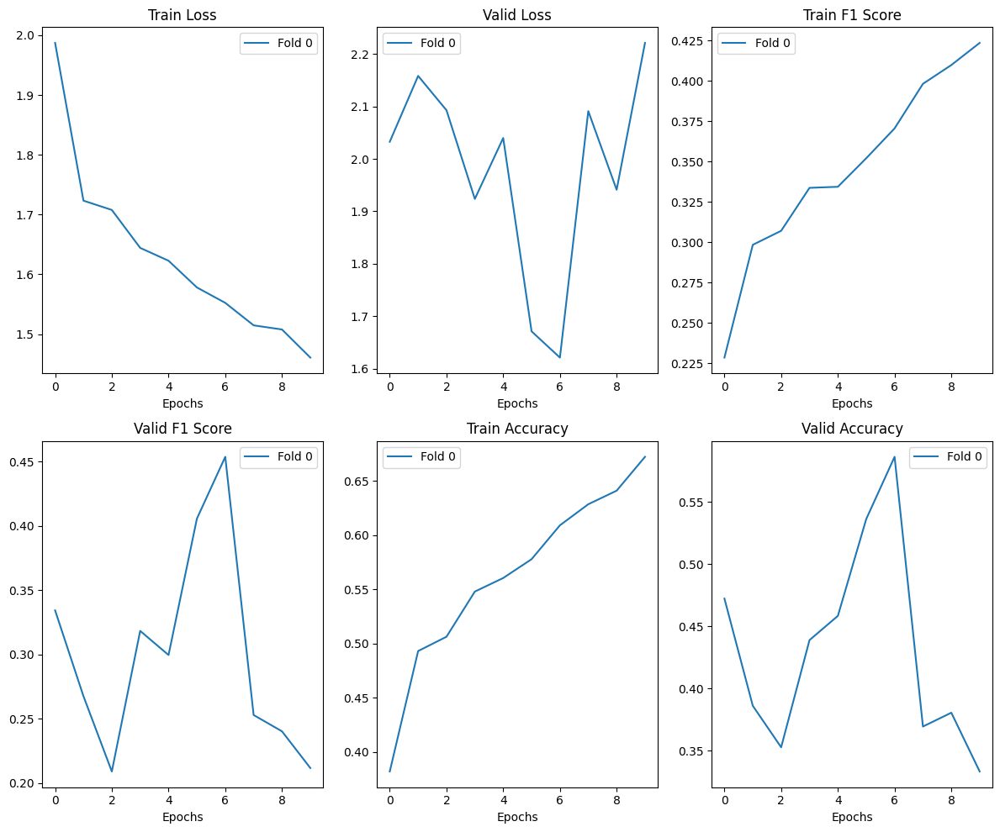

<Figure size 1200x1000 with 0 Axes>

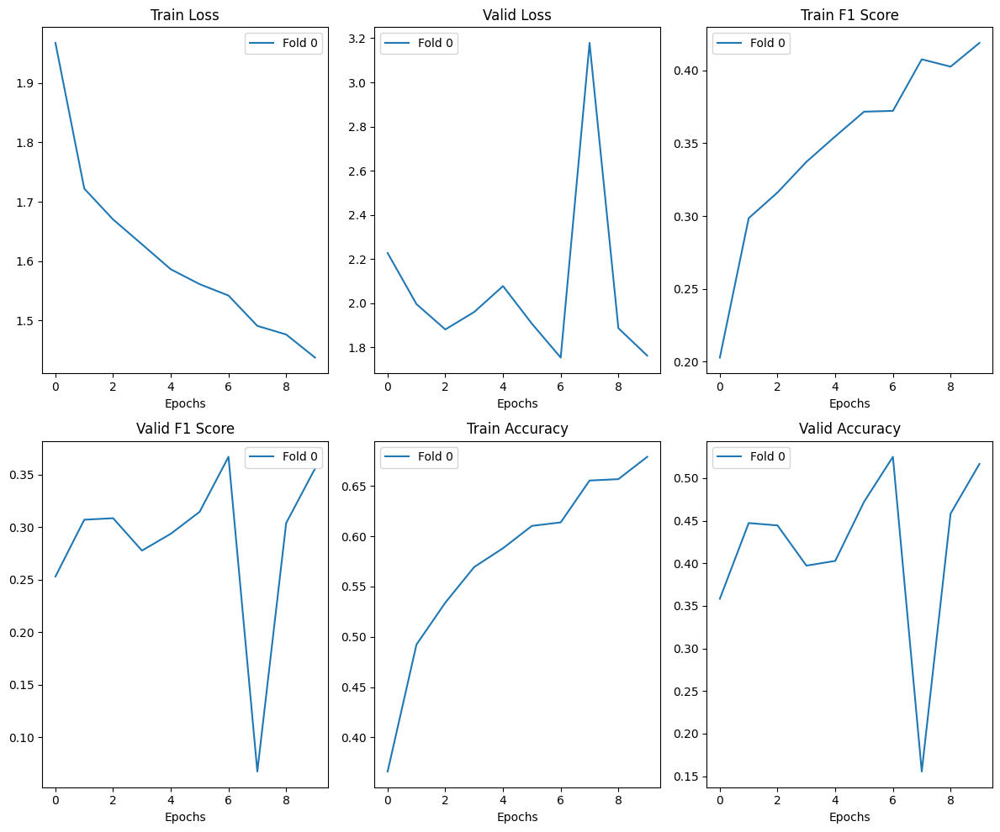

In [26]:
def plot_training_history(all_history):
    if LOAD_MODELS_FROM is None:
        plt.figure(figsize=(12,10))
        
        plt.subplot(2,3,1)
        plt.title('Train Loss')
        for fold, i in enumerate(all_history['Train Loss']):
            plt.plot(i, label=f'Fold {fold}')
        plt.xlabel('Epochs')
        plt.legend()
        plt.subplot(2,3,2)
        plt.title('Valid Loss')
        for fold, i in enumerate(all_history['Valid Loss']):
            plt.plot(i, label=f'Fold {fold}')
        plt.xlabel('Epochs')
        plt.legend()
        plt.subplot(2,3,3)
        plt.title('Train F1 Score')
        for fold, i in enumerate(all_history['Train F1']):
            plt.plot(i, label=f'Fold {fold}')
        plt.xlabel('Epochs')
        plt.legend()
        
        plt.subplot(2,3,4)
        plt.title('Valid F1 Score')
        for fold, i in enumerate(all_history['Valid F1']):
            plt.plot(i, label=f'Fold {fold}')
        plt.xlabel('Epochs')
        plt.legend()
        plt.subplot(2,3,5)
        plt.title('Train Accuracy')
        for fold, i in enumerate(all_history['Train Accuracy']):
            plt.plot(i, label=f'Fold {fold}')
        plt.xlabel('Epochs')
        plt.legend()
        plt.subplot(2,3,6)
        plt.title('Valid Accuracy')
        for fold, i in enumerate(all_history['Valid Accuracy']):
            plt.plot(i, label=f'Fold {fold}')
        plt.xlabel('Epochs')
        plt.legend()
        
        plt.tight_layout()
        plt.show()

# 각 실험 결과에 대해 학습 히스토리 플롯
for result in results:
    clip_limit = result['clip_limit']
    tile_grid_size = result['tile_grid_size']
    plt.figure(figsize=(12,10))
    plt.suptitle(f'Training History (CLAHE: clip={clip_limit}, tile={tile_grid_size})')
    plot_training_history(result['all_history'])
    plt.show()

In [27]:
# 결과 분석
results_df = pd.DataFrame([(r['clip_limit'], r['tile_grid_size'], r['accuracy'], r['f1_score']) for r in results],
                          columns=['clip_limit', 'tile_grid_size', 'accuracy', 'f1_score'])
print(results_df)

# 최고의 성능을 보인 설정 찾기
best_result = results_df.loc[results_df['f1_score'].idxmax()]
print("Best CLAHE settings:")
print(f"Clip Limit: {best_result['clip_limit']}")
print(f"Tile Grid Size: {best_result['tile_grid_size']}")
print(f"F1 Score: {best_result['f1_score']}")
print(f"Accuracy: {best_result['accuracy']}")

    clip_limit tile_grid_size  accuracy  f1_score
0          1.0         (2, 2)  0.450000  0.421737
1          1.0         (4, 4)  0.480556  0.465028
2          1.0         (8, 8)  0.508333  0.505742
3          2.0         (2, 2)  0.527778  0.484293
4          2.0         (4, 4)  0.402778  0.356211
5          2.0         (8, 8)  0.412500  0.381862
6          0.0         (2, 2)  0.516667  0.505972
7          0.0         (4, 4)  0.429167  0.406668
8          0.0         (8, 8)  0.495833  0.480139
9          3.0         (2, 2)  0.511111  0.470914
10         3.0         (4, 4)  0.458333  0.440998
11         3.0         (8, 8)  0.368056  0.319500
12         0.0         (2, 2)  0.445833  0.412927
13         0.0         (4, 4)  0.418056  0.357350
14         0.0         (8, 8)  0.488889  0.466116
15         4.0         (2, 2)  0.400000  0.353608
16         4.0         (4, 4)  0.552778  0.525202
17         4.0         (8, 8)  0.462500  0.452554
18         0.0         (2, 2)  0.469444  0.461599


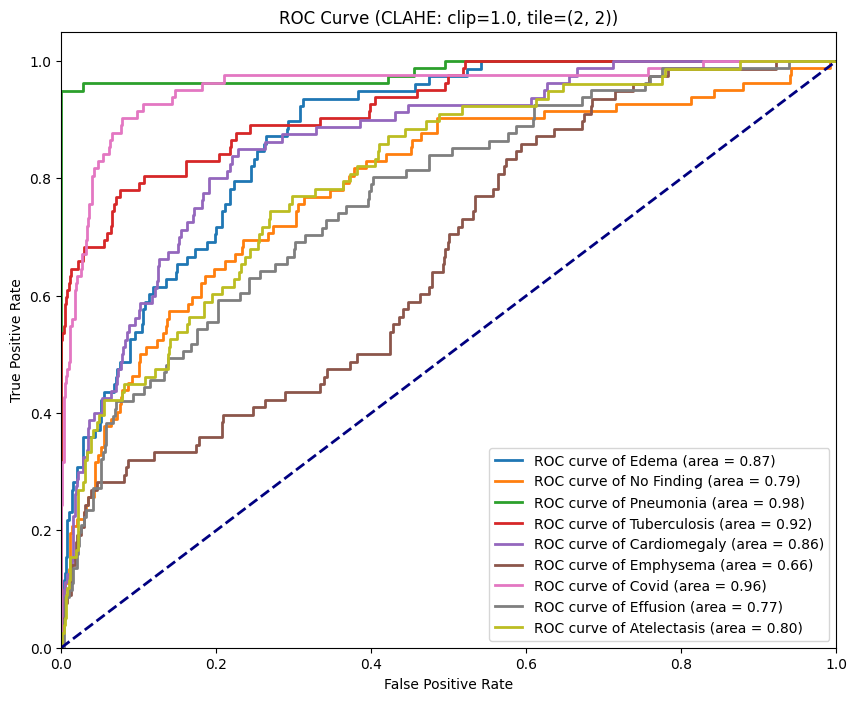

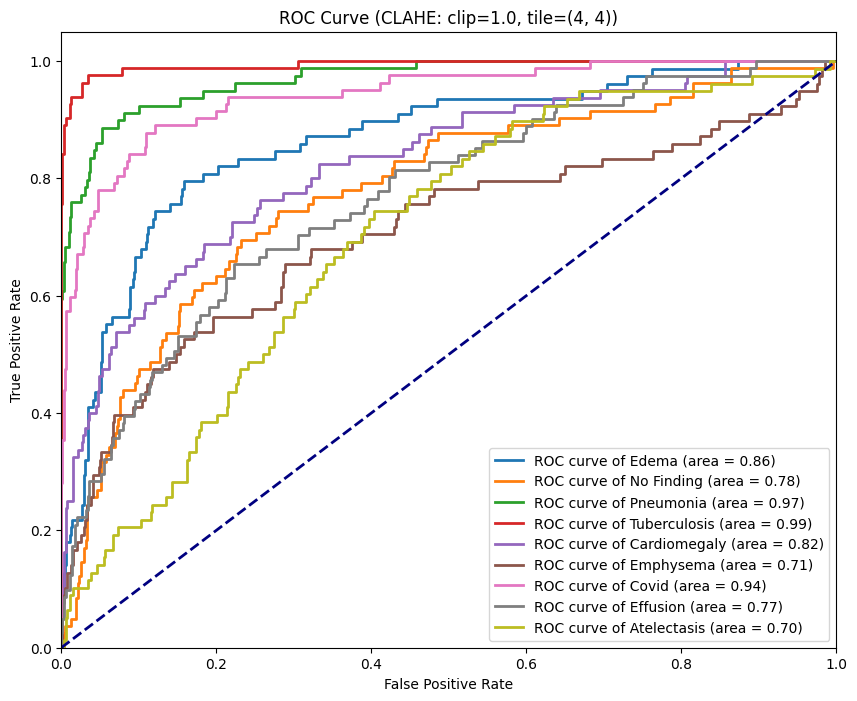

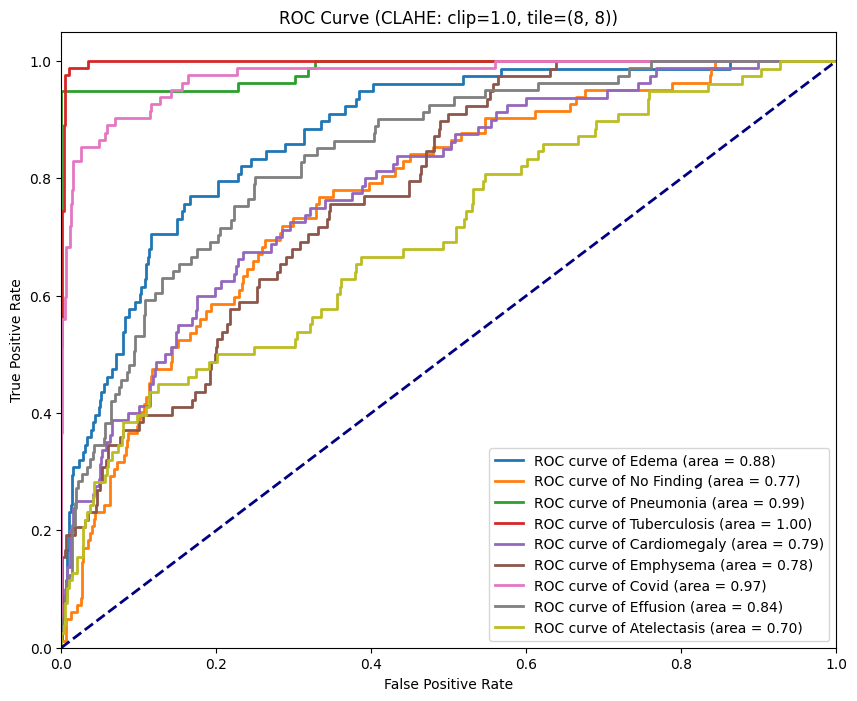

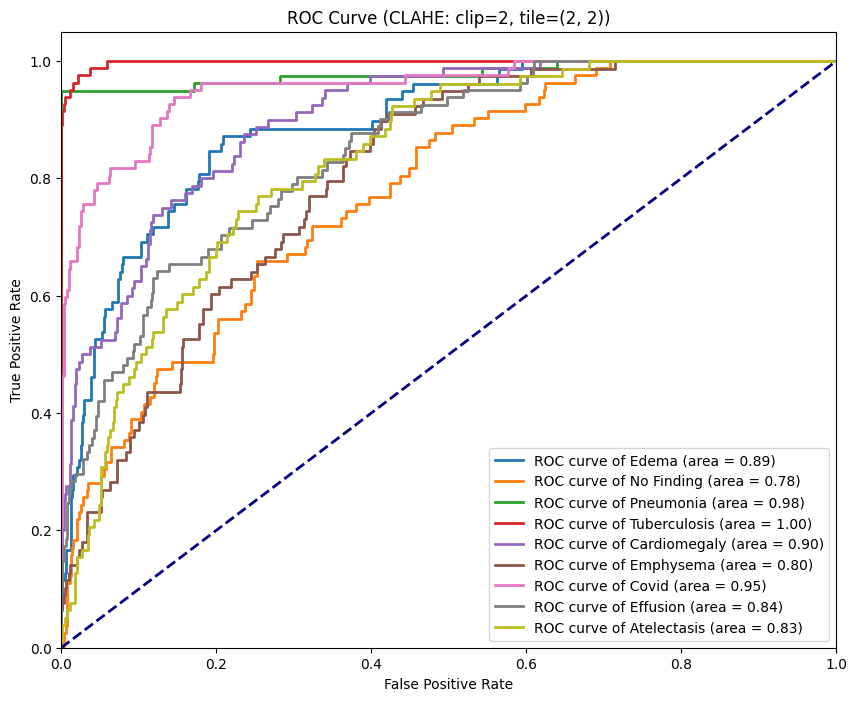

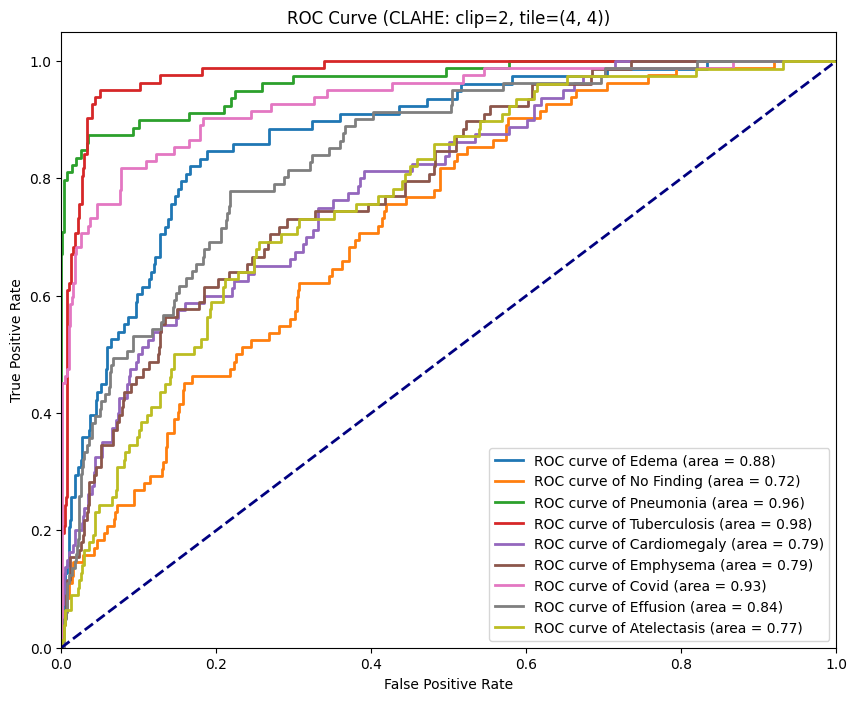

...

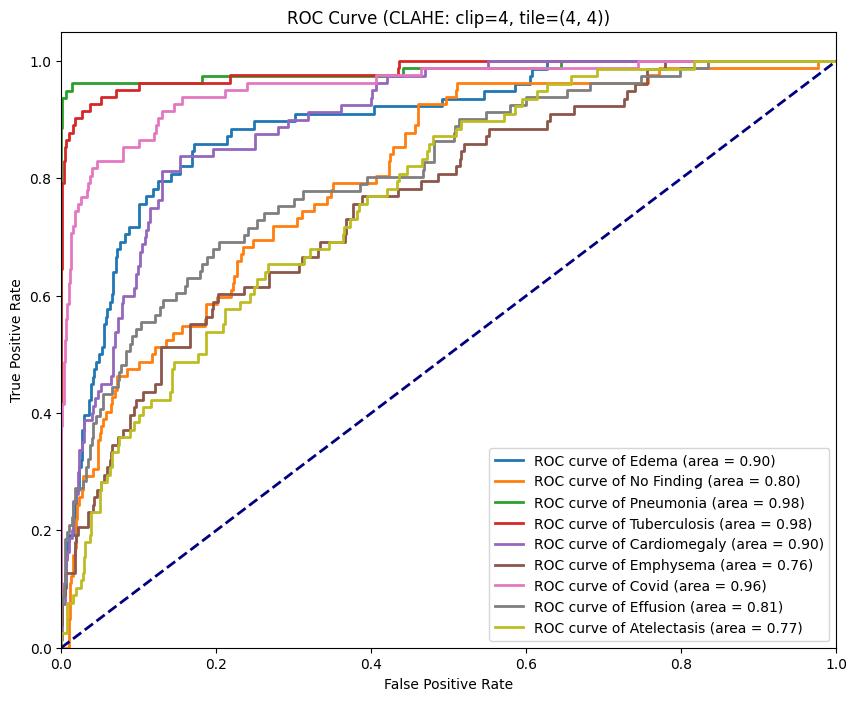

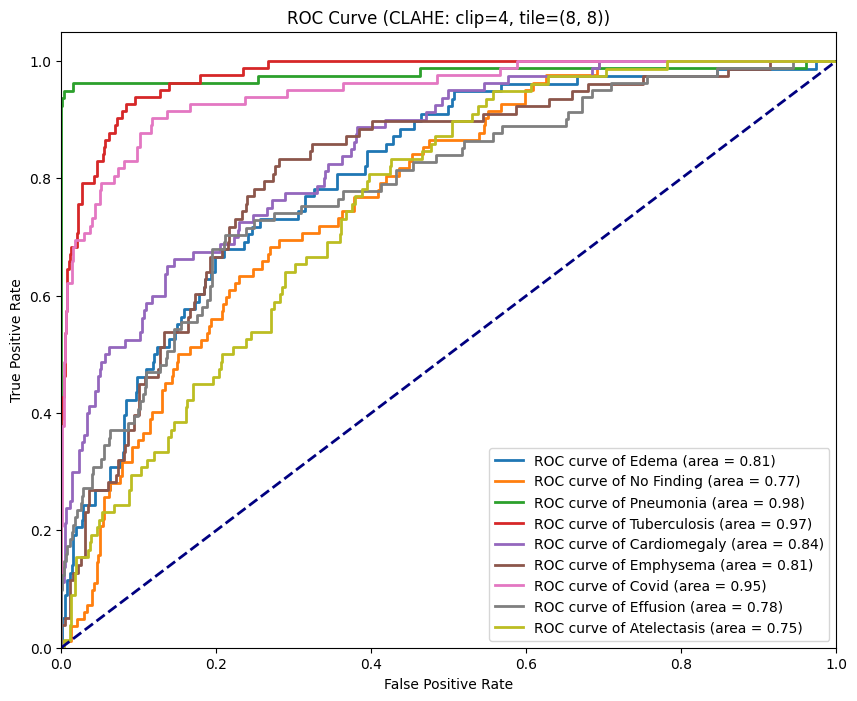

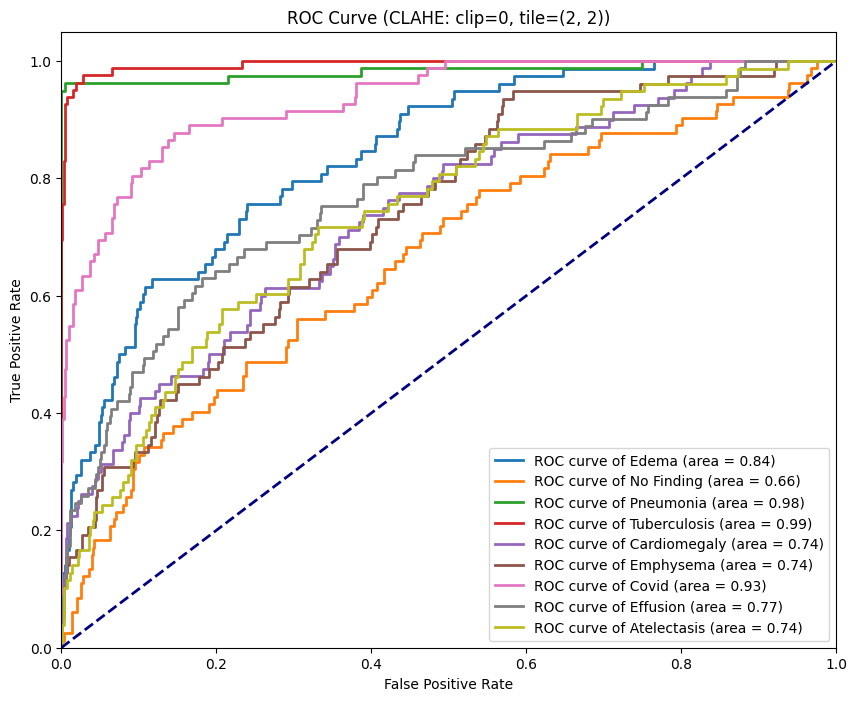

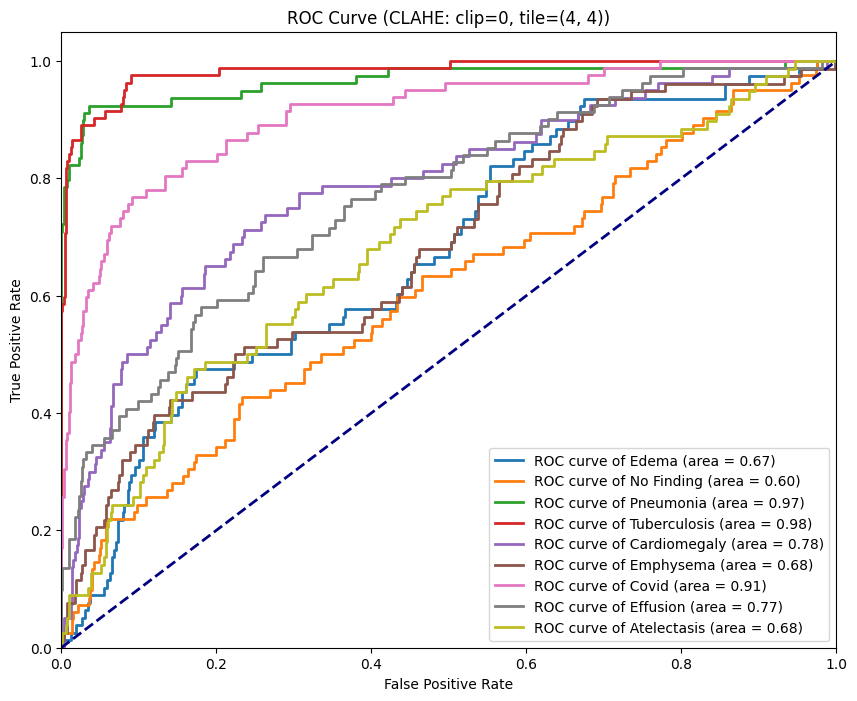

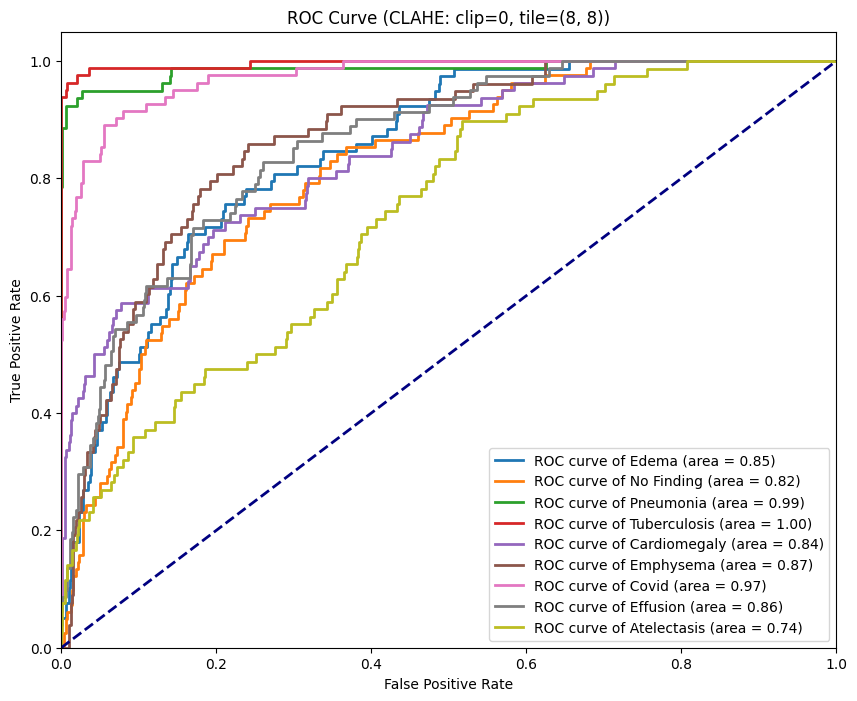

In [28]:
for result in results:
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(TARGET)):
        fpr[i], tpr[i], _ = roc_curve(result['all_true'][:, i], result['all_oof'][:,i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    # ROC 곡선 그리기
    plt.figure(figsize=(10, 8))
    for i in range(len(TARGET)):
        plt.plot(fpr[i], tpr[i], lw=2,
                 label=f'ROC curve of {TARGET[i]} (area = {roc_auc[i]:0.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve (CLAHE: clip={result["clip_limit"]}, tile={result["tile_grid_size"]})')
    plt.legend(loc="lower right")
    plt.show()

# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>5. Inference</b></div>


Processing result with CLAHE: clip=1.0, tile=(2, 2)
Fold 1
 1/15 ━━━━━━━━━━━━━━━━━━━━ 58s 4s/step

I0000 00:00:1724016428.482458      70 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


15/15 ━━━━━━━━━━━━━━━━━━━━ 39s 2s/step
Accuracy for Test Set = 0.47
F1 Score for Test Set = 0.44019292933782694


<Figure size 1000x800 with 0 Axes>

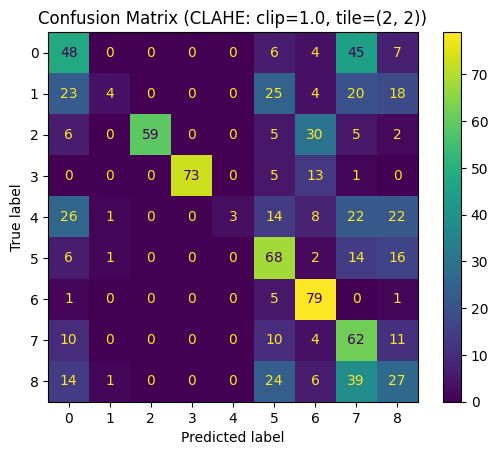

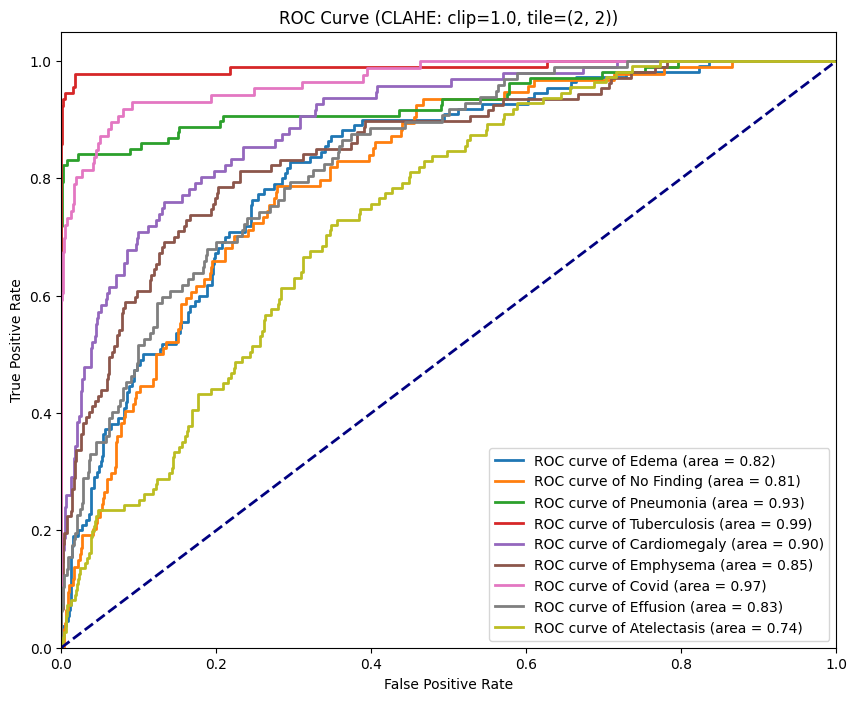


Processing result with CLAHE: clip=1.0, tile=(4, 4)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.4
F1 Score for Test Set = 0.41103786438597495


<Figure size 1000x800 with 0 Axes>

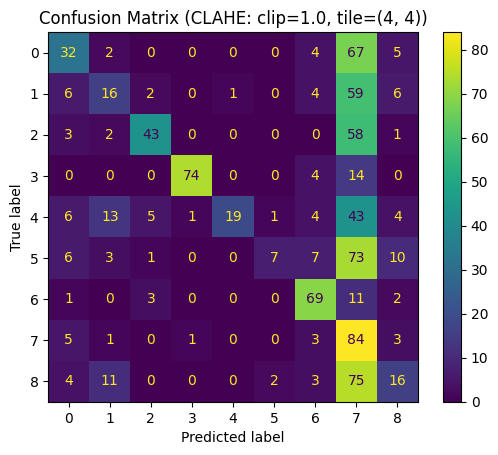

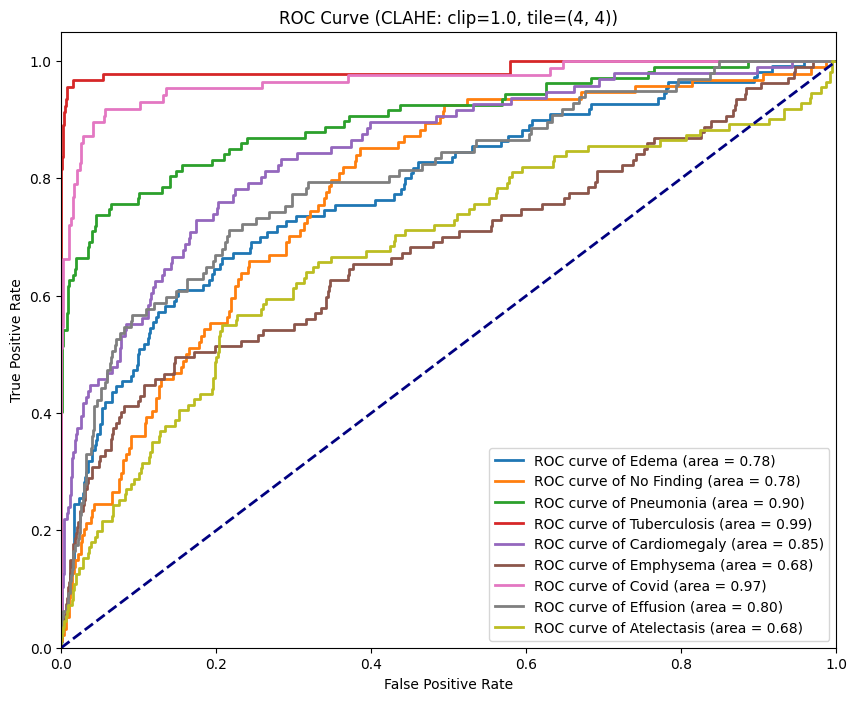


Processing result with CLAHE: clip=1.0, tile=(8, 8)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.47444444444444445
F1 Score for Test Set = 0.46975165913757116


<Figure size 1000x800 with 0 Axes>

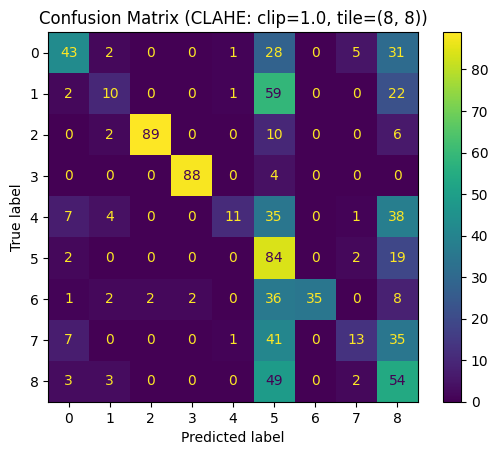

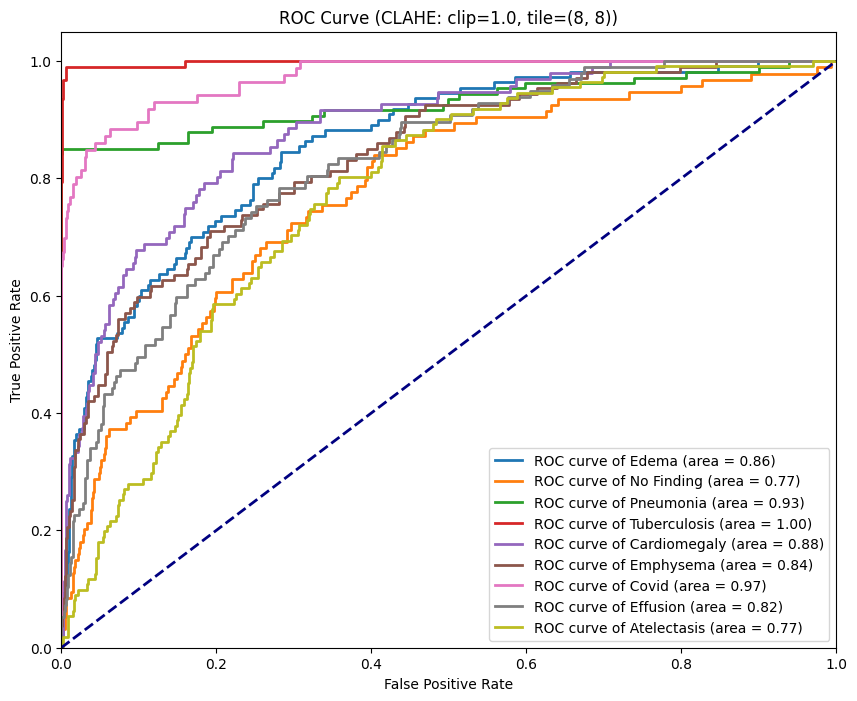


Processing result with CLAHE: clip=2, tile=(2, 2)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.4533333333333333
F1 Score for Test Set = 0.4306264977866439


<Figure size 1000x800 with 0 Axes>

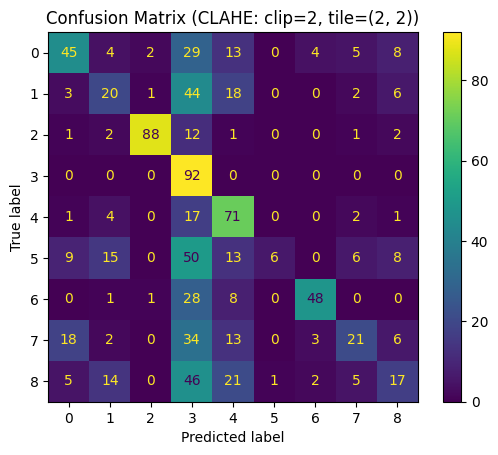

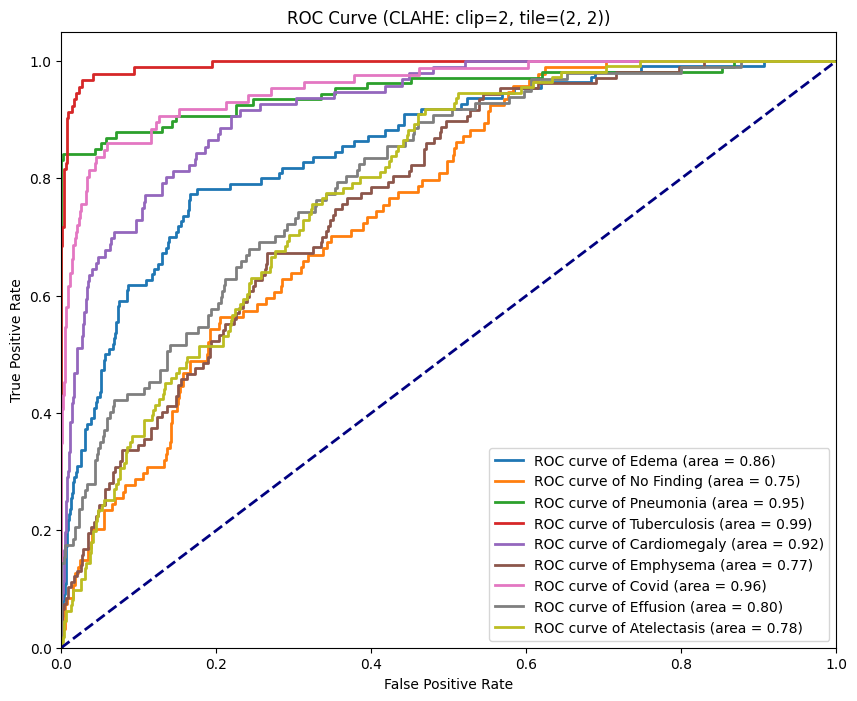


Processing result with CLAHE: clip=2, tile=(4, 4)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step
Accuracy for Test Set = 0.3211111111111111
F1 Score for Test Set = 0.2642207311027708


<Figure size 1000x800 with 0 Axes>

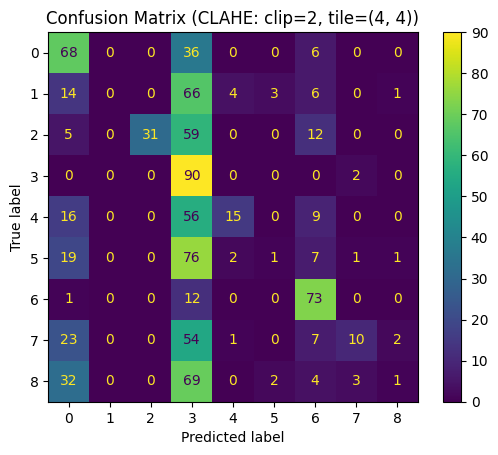

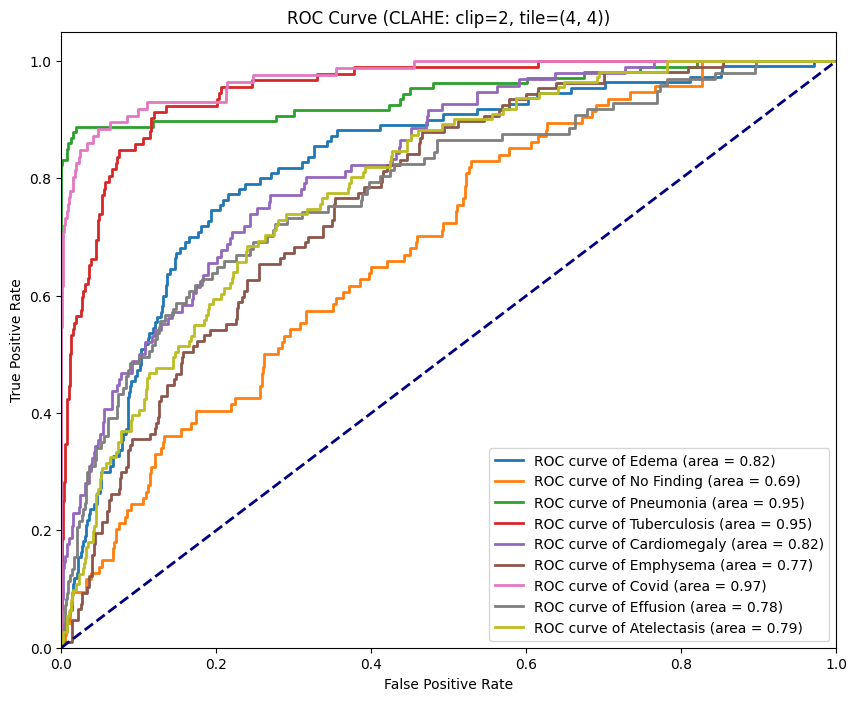


Processing result with CLAHE: clip=2, tile=(8, 8)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.35333333333333333
F1 Score for Test Set = 0.2886347708104636


<Figure size 1000x800 with 0 Axes>

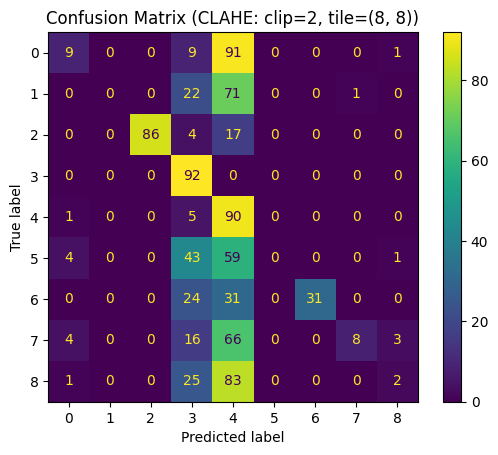

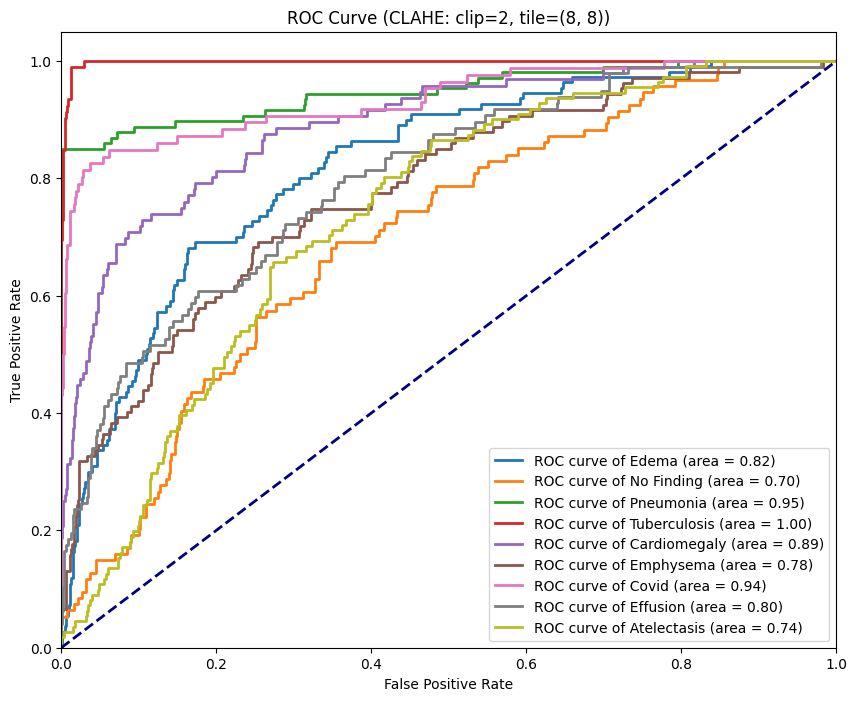


Processing result with CLAHE: clip=0, tile=(2, 2)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.36777777777777776
F1 Score for Test Set = 0.34802365423562404


<Figure size 1000x800 with 0 Axes>

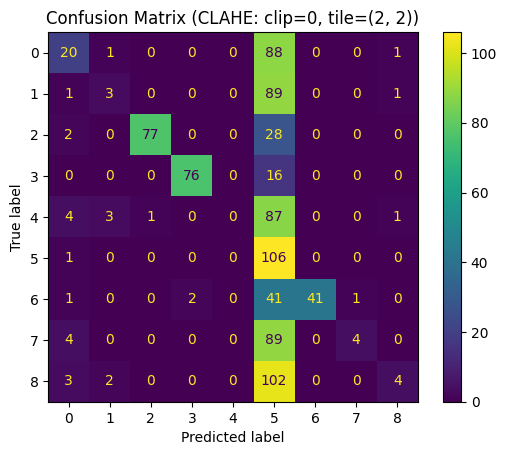

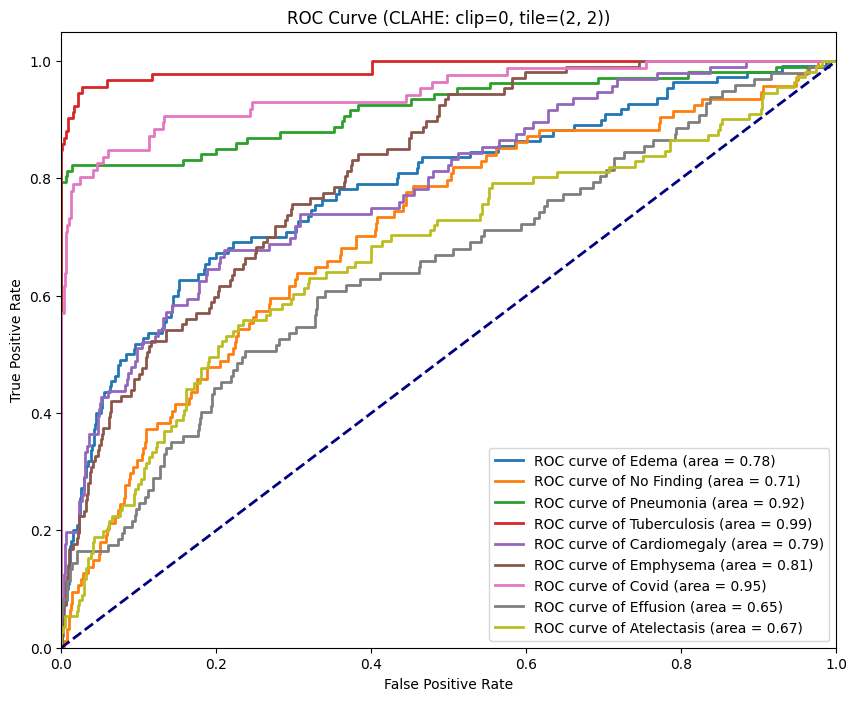


Processing result with CLAHE: clip=0, tile=(4, 4)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.4222222222222222
F1 Score for Test Set = 0.4082668512191286


<Figure size 1000x800 with 0 Axes>

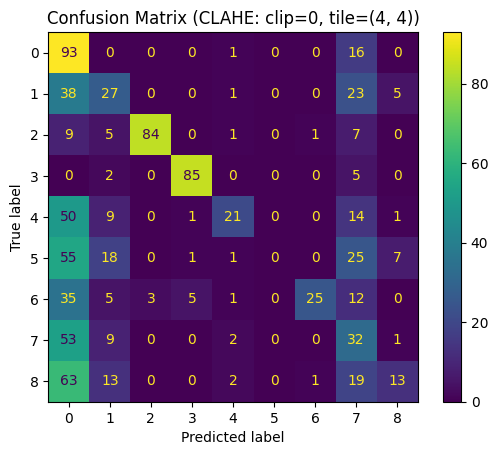

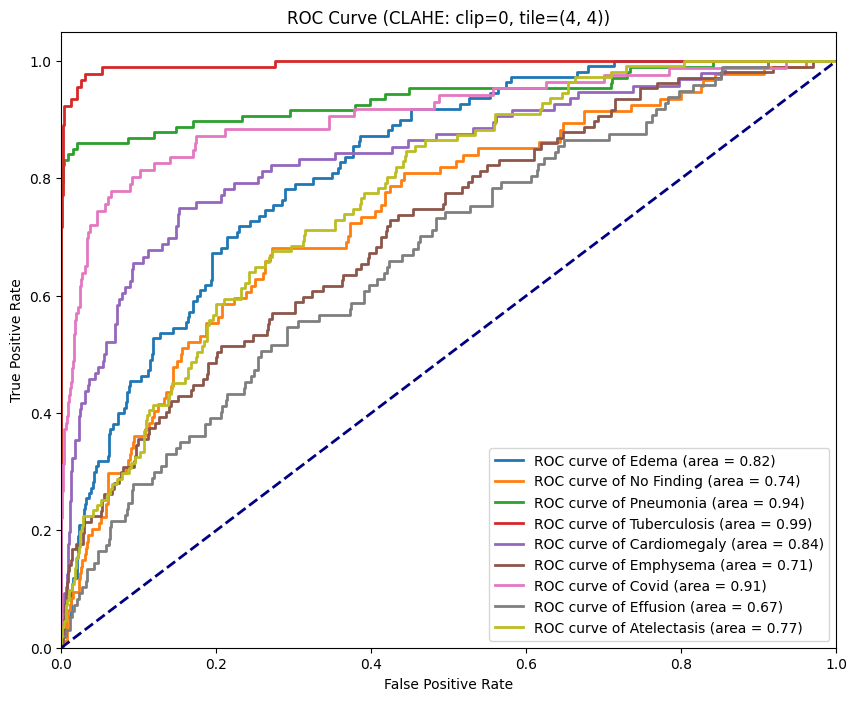


Processing result with CLAHE: clip=0, tile=(8, 8)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.32666666666666666
F1 Score for Test Set = 0.26834103823258226


<Figure size 1000x800 with 0 Axes>

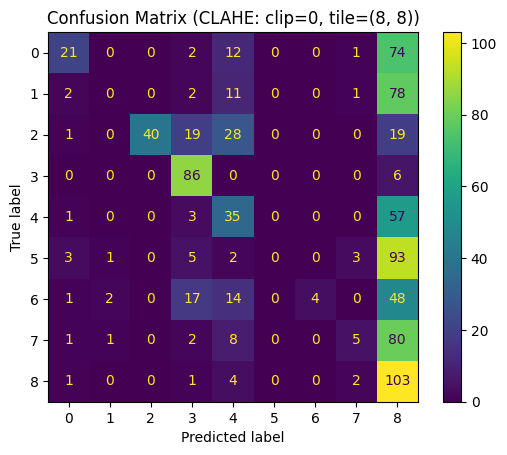

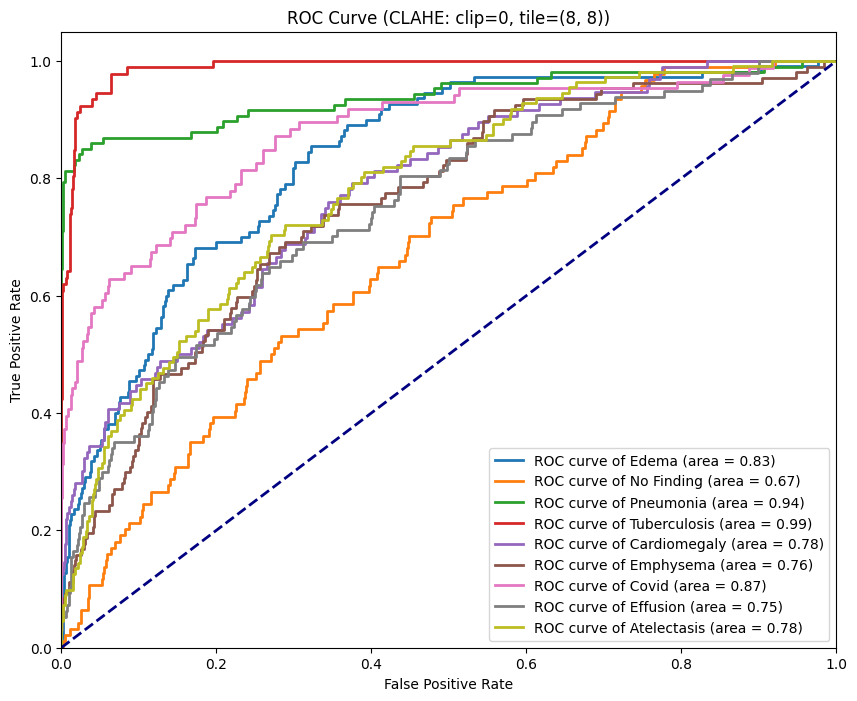


Processing result with CLAHE: clip=3, tile=(2, 2)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.5255555555555556
F1 Score for Test Set = 0.5055612705605155


<Figure size 1000x800 with 0 Axes>

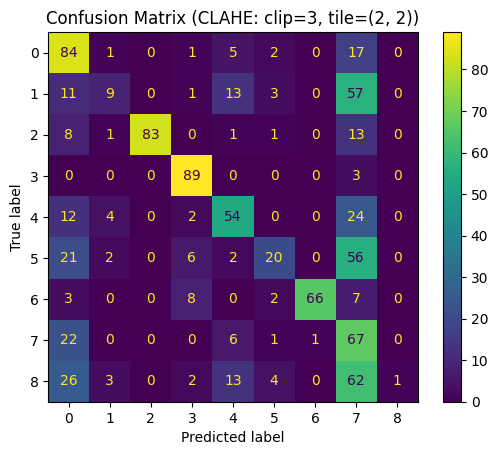

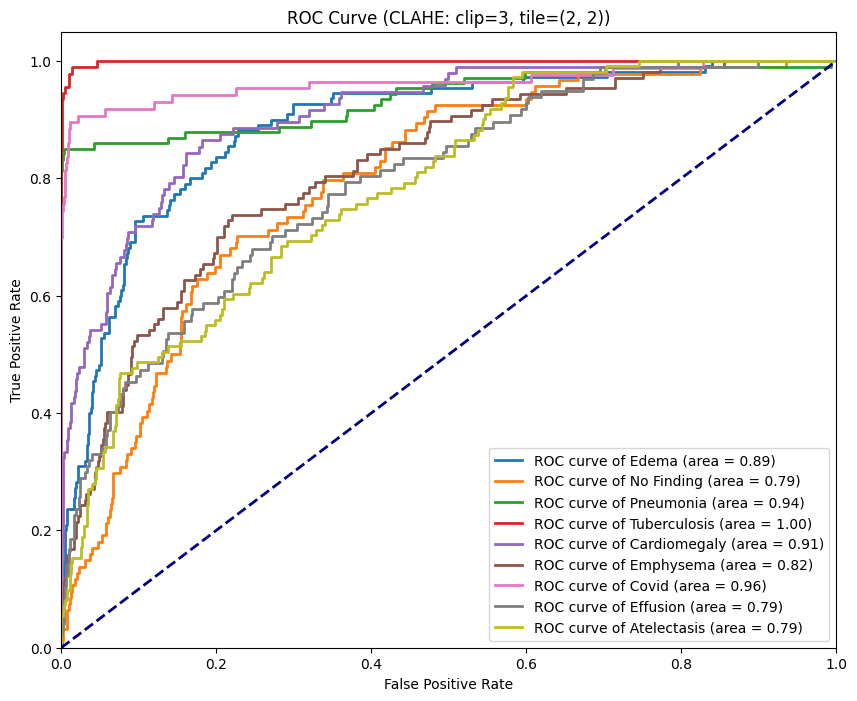


Processing result with CLAHE: clip=3, tile=(4, 4)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.44555555555555554
F1 Score for Test Set = 0.4358069740819718


<Figure size 1000x800 with 0 Axes>

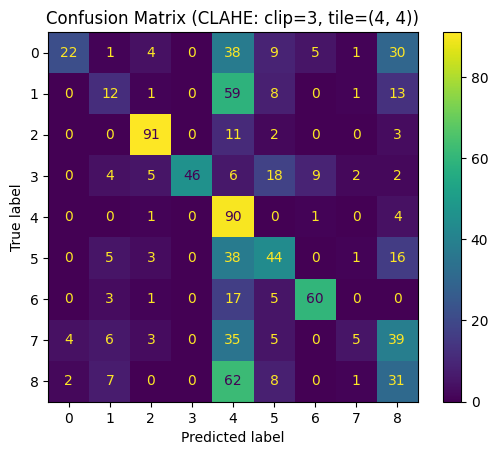

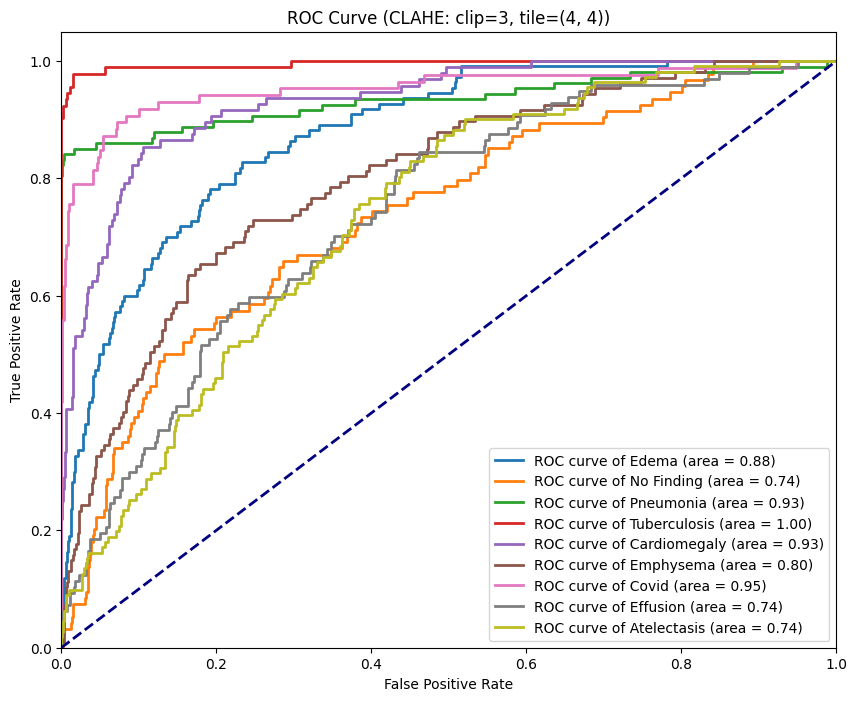


Processing result with CLAHE: clip=3, tile=(8, 8)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.4955555555555556
F1 Score for Test Set = 0.475403892803213


<Figure size 1000x800 with 0 Axes>

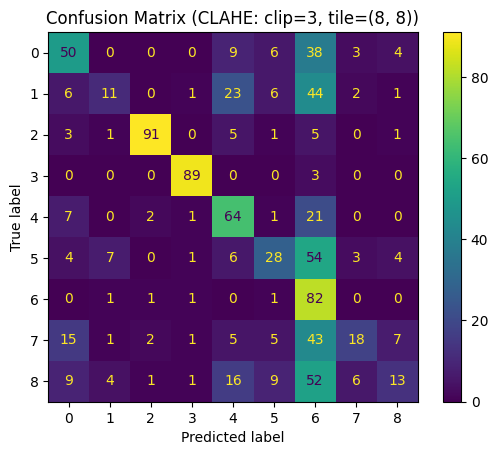

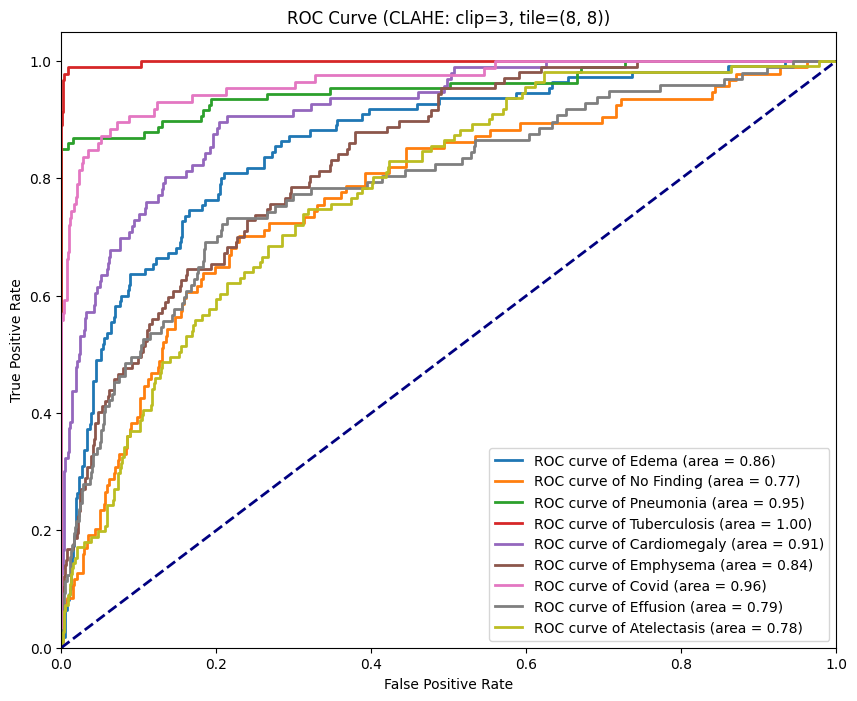


Processing result with CLAHE: clip=0, tile=(2, 2)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.36777777777777776
F1 Score for Test Set = 0.34802365423562404


<Figure size 1000x800 with 0 Axes>

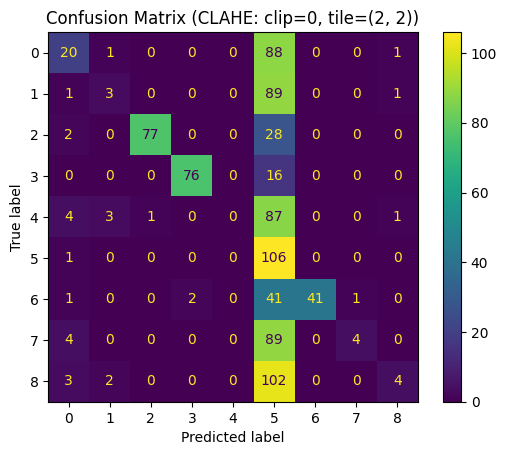

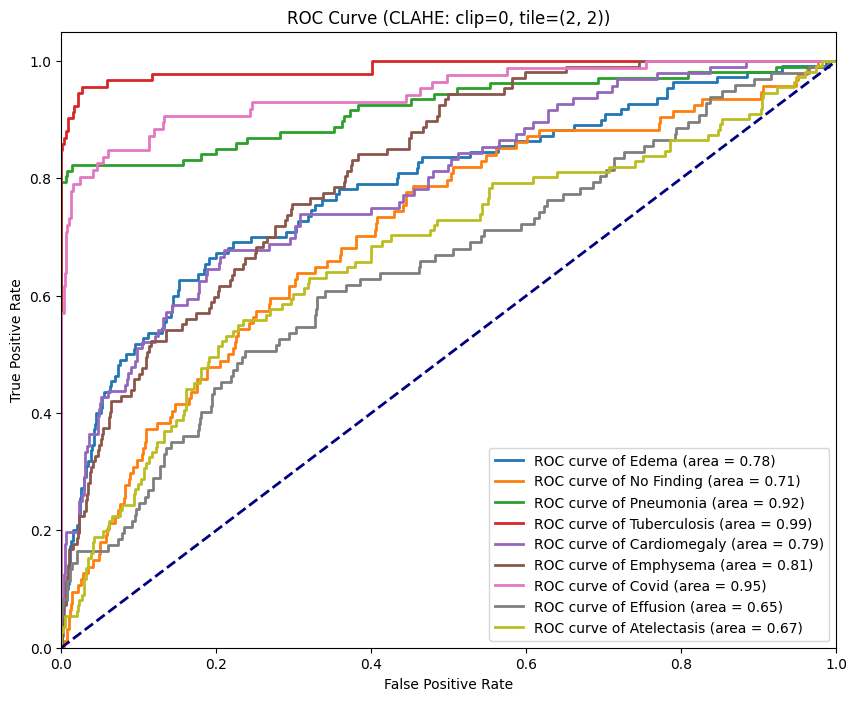


Processing result with CLAHE: clip=0, tile=(4, 4)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step
Accuracy for Test Set = 0.4222222222222222
F1 Score for Test Set = 0.4082668512191286


<Figure size 1000x800 with 0 Axes>

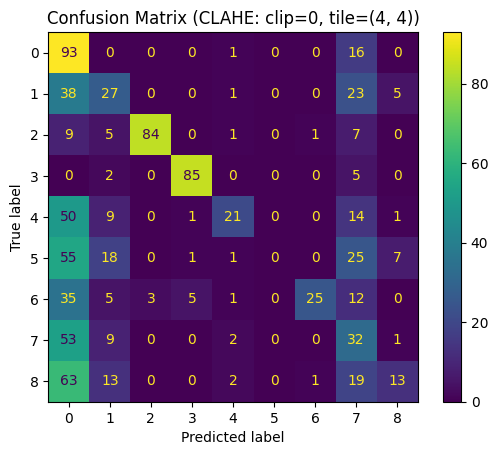

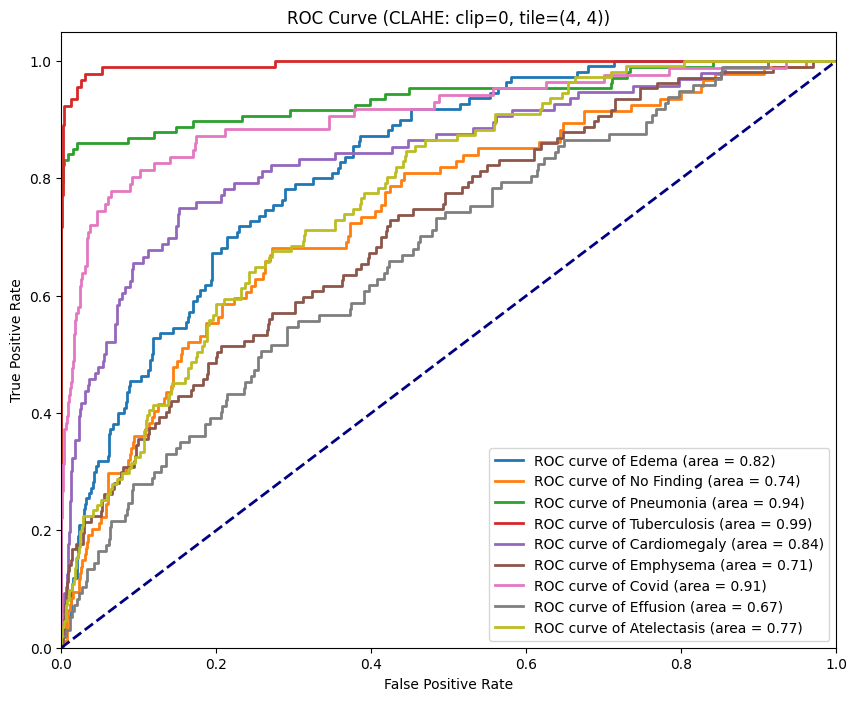


Processing result with CLAHE: clip=0, tile=(8, 8)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step
Accuracy for Test Set = 0.32666666666666666
F1 Score for Test Set = 0.26834103823258226


<Figure size 1000x800 with 0 Axes>

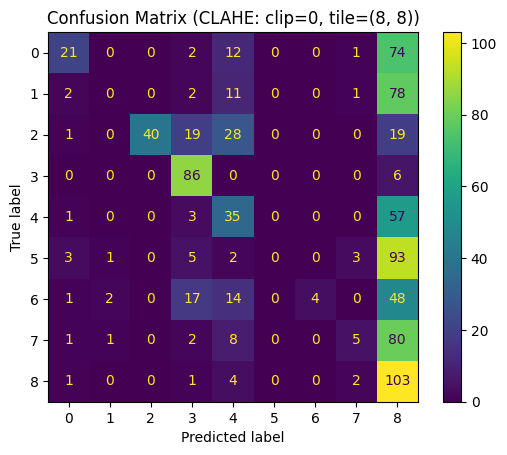

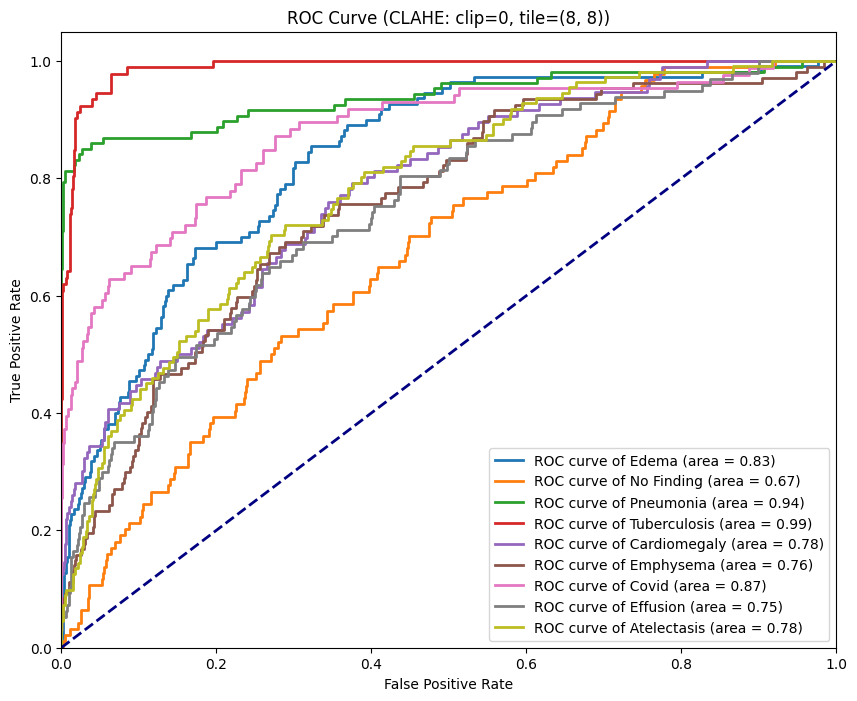


Processing result with CLAHE: clip=4, tile=(2, 2)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.45666666666666667
F1 Score for Test Set = 0.4034687182014692


<Figure size 1000x800 with 0 Axes>

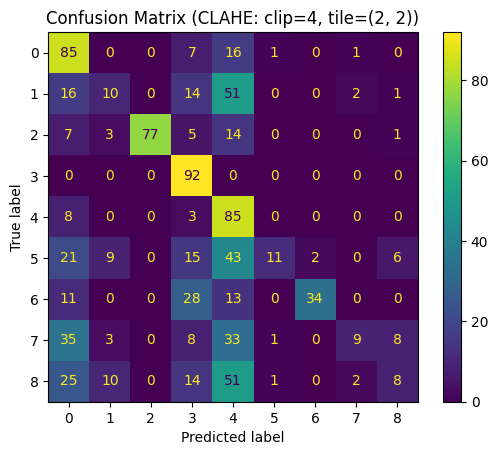

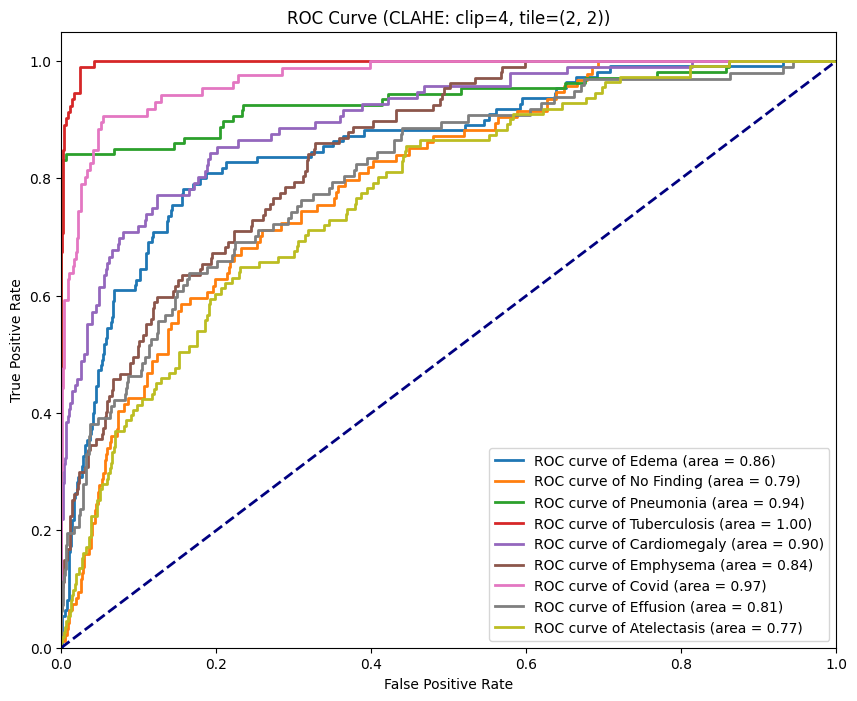


Processing result with CLAHE: clip=4, tile=(4, 4)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.5577777777777778
F1 Score for Test Set = 0.5431996040011455


<Figure size 1000x800 with 0 Axes>

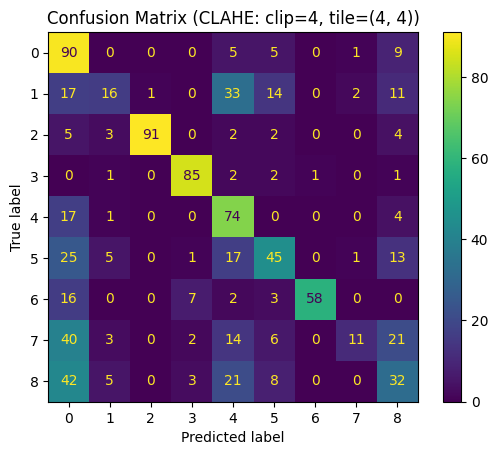

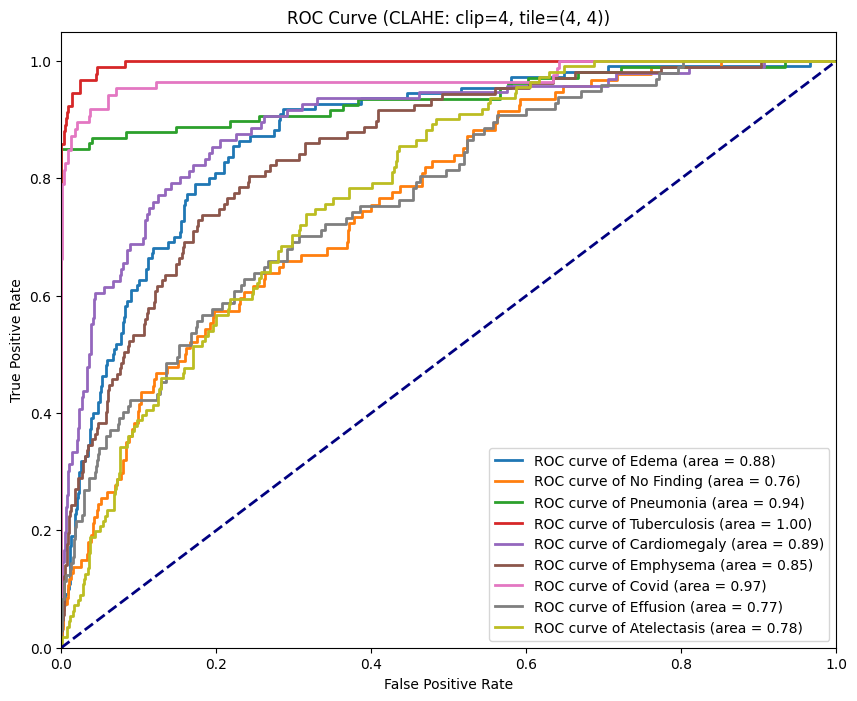


Processing result with CLAHE: clip=4, tile=(8, 8)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.4388888888888889
F1 Score for Test Set = 0.4062940107549329


<Figure size 1000x800 with 0 Axes>

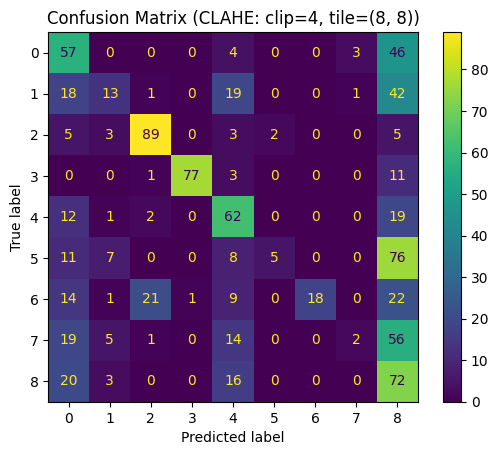

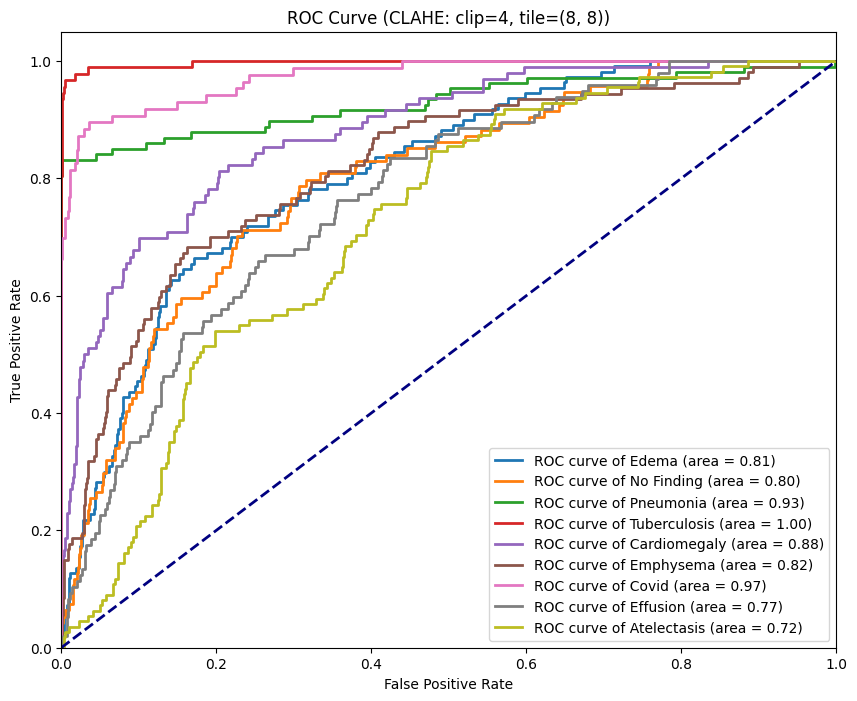


Processing result with CLAHE: clip=0, tile=(2, 2)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.36777777777777776
F1 Score for Test Set = 0.34802365423562404


<Figure size 1000x800 with 0 Axes>

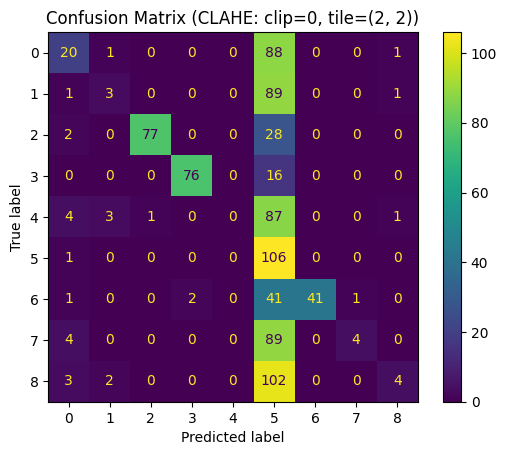

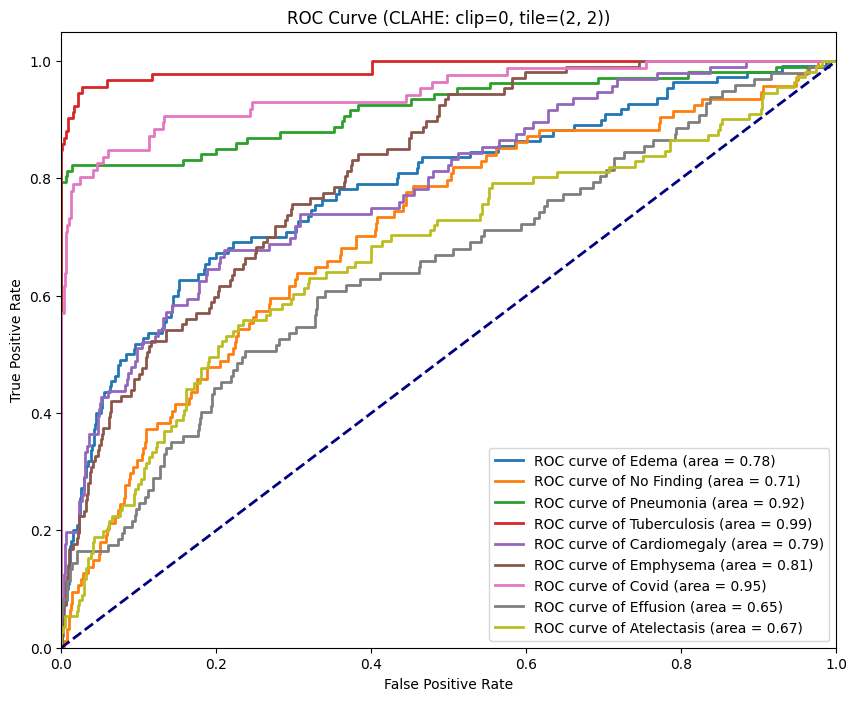


Processing result with CLAHE: clip=0, tile=(4, 4)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.4222222222222222
F1 Score for Test Set = 0.4082668512191286


<Figure size 1000x800 with 0 Axes>

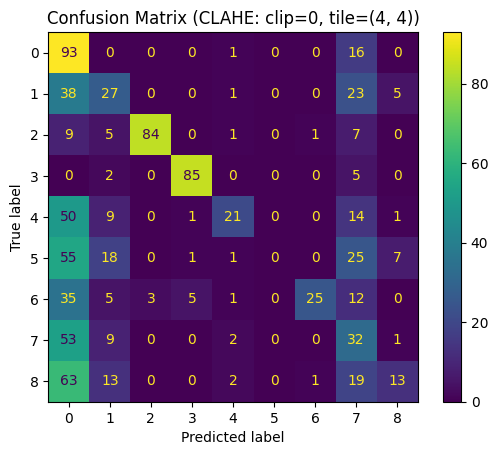

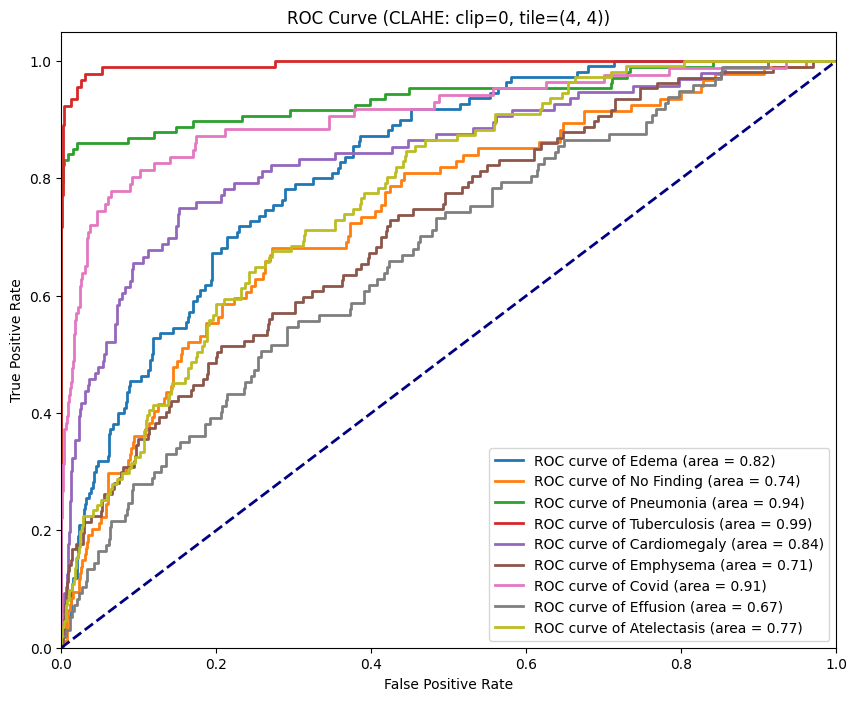


Processing result with CLAHE: clip=0, tile=(8, 8)
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set = 0.32666666666666666
F1 Score for Test Set = 0.26834103823258226


<Figure size 1000x800 with 0 Axes>

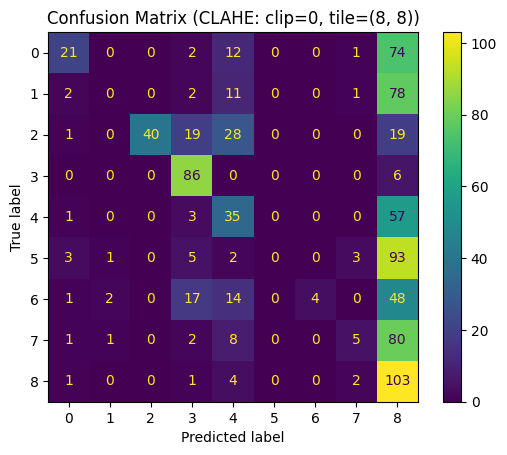

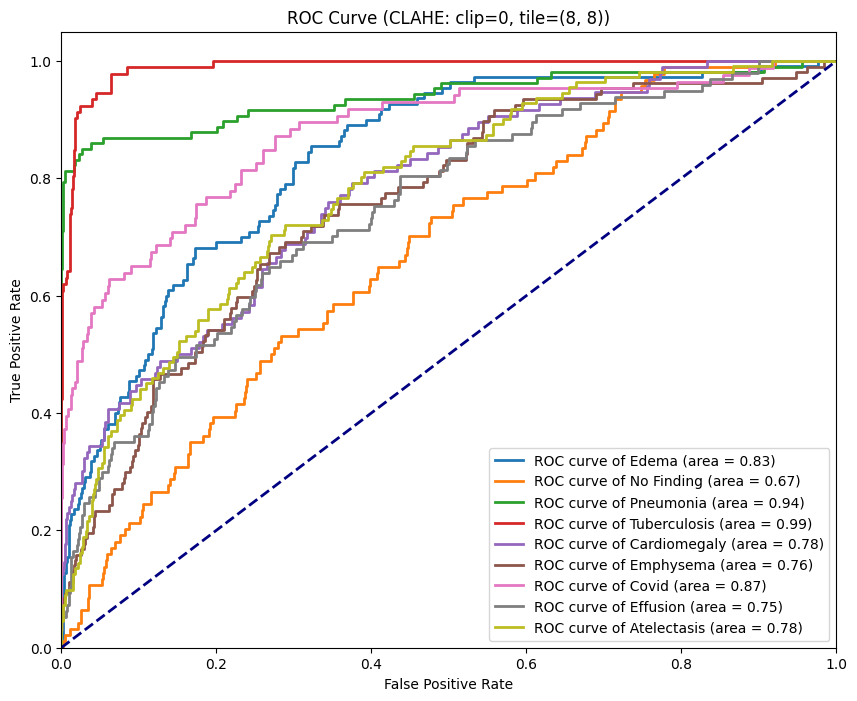

In [29]:
for result in results:
    clip_limit = result['clip_limit']
    tile_grid_size = result['tile_grid_size']
    
    print(f"\nProcessing result with CLAHE: clip={clip_limit}, tile={tile_grid_size}")
    
    preds = []
    model = build_model()
    
    ## No TTA
    test_gen = DataGenerator(df_test, shuffle=False, batch_size=64, preprocess=preprocess_input)
    for i in range(1):
        print(f'Fold {i+1}') 
        if LOAD_MODELS_FROM:
            model.load_weights(f'{LOAD_MODELS_FROM}ResNet_f{i}_clip{clip_limit}_tile{tile_grid_size[0]}.weights.h5')
        else: 
            model.load_weights(f'ResNet_f{i}_clip{clip_limit}_tile{tile_grid_size[0]}.weights.h5')
    
        pred = model.predict(test_gen, verbose=1) 
        
        preds.append(pred)
    
    pred_res = np.mean(preds, axis=0)
    
    # Accuracy
    accuracy = accuracy_score(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1))
    print('Accuracy for Test Set =', accuracy)
    
    # F1 Score
    f1 = f1_score(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1), average='macro')
    print('F1 Score for Test Set =', f1)
    
    # Confusion Matrix
    cm = confusion_matrix(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1), labels=[x for x in range(len(TARGET))])
    display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[x for x in range(len(TARGET))])
    plt.figure(figsize=(10, 8))
    display.plot()
    plt.title(f'Confusion Matrix (CLAHE: clip={clip_limit}, tile={tile_grid_size})')
    plt.show()

    # ROC Curve
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i, target in enumerate(TARGET):
        fpr[i], tpr[i], _ = roc_curve(df_test[target], pred_res[:,i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # ROC 곡선 그리기
    plt.figure(figsize=(10, 8))
    for i, target in enumerate(TARGET):
        plt.plot(fpr[i], tpr[i], lw=2,
                 label=f'ROC curve of {target} (area = {roc_auc[i]:0.2f})')
    
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve (CLAHE: clip={clip_limit}, tile={tile_grid_size})')
    plt.legend(loc="lower right")
    plt.show()

#### TTA
___

In [30]:
"""## No TTA
test_gen = DataGenerator(df_test, shuffle=False, augment1=True, batch_size=64, preprocess=preprocess_input)

for i in range(1):
    print(f'Fold {i+1}') 
    if LOAD_MODELS_FROM:
        model.load_weights(f'{LOAD_MODELS_FROM}ResNet_f{i}.weights.h5')
    else: 
        model.load_weights(f'ResNet_f{i}.weights.h5')
    
    pred = model.predict(test_gen, verbose=1) 
    
preds.append(pred)
pred_res = np.mean(preds,axis=0)
    
# Accuracy 
accuracy = accuracy_score(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1))
print('Accuracy for Test Set =', accuracy)

# F1 Score 
f1 = f1_score(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1), average='macro') 
print('F1 Score for Test Set =', f1)"""

"## No TTA\ntest_gen = DataGenerator(df_test, shuffle=False, augment1=True, batch_size=64, preprocess=preprocess_input)\n\nfor i in range(1):\n    print(f'Fold {i+1}') \n    if LOAD_MODELS_FROM:\n        model.load_weights(f'{LOAD_MODELS_FROM}ResNet_f{i}.weights.h5')\n    else: \n        model.load_weights(f'ResNet_f{i}.weights.h5')\n    \n    pred = model.predict(test_gen, verbose=1) \n    \npreds.append(pred)\npred_res = np.mean(preds,axis=0)\n    \n# Accuracy \naccuracy = accuracy_score(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1))\nprint('Accuracy for Test Set =', accuracy)\n\n# F1 Score \nf1 = f1_score(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1), average='macro') \nprint('F1 Score for Test Set =', f1)"